# F090W SBF: калибровка, точность и систематики

Отдельный анализ всех 14 галактик GO-3055 в фильтре F090W. Исходные
изображения здесь не переобрабатываются: notebook читает только итоговые
продукты `run_sbf_f090w.py`, опубликованные через стабильные
`products.json`.

Здесь последовательно проверяются:

1. полнота входных результатов и привязка к индивидуальным расстояниям Paper IV;
2. постоянная, линейная и несколько простых нелинейных цветовых моделей;
3. ошибки цвета, их ковариация с F090W и внутренний разброс калибровки;
4. четыре заранее заданные выборки: 14, визуальные 11, автоматические 10 и Paper-IV HQ 9;
5. внутреннее, внешнее и взвешенное измерения;
6. Virgo/Fornax и влияние отдельных объектов без ручного исключения;
7. leave-one-out (LOO), 68% доверительные и предсказательные коридоры;
8. расстояния в Мпк с разложением ошибок и сравнением с TRGB;
9. прямое сравнение F090W и F150W SBF;
10. чувствительность к размеру STPSF 129/257 пикселей.

Серый тёмный коридор на калибровочных графиках — 68% неопределённость
средней зависимости; светло-серый — 68% предсказательный коридор с учётом
внутреннего разброса. Нелинейные модели являются исследовательскими: при
14 точках их нельзя выбирать только за красивый вид кривой.

## 0. Настройки и пути

Все рисунки одновременно сохраняются в PNG/PDF и встраиваются прямо в
notebook. Поэтому после выполнения ячейки картинка видна здесь, а не только
в каталоге результатов.

In [1]:
from pathlib import Path
import json
import os
import re
from itertools import combinations

import numpy as np
import pandas as pd
import matplotlib as mpl
from IPython import get_ipython
from IPython.display import Image, display
from astropy.io import fits
from scipy.optimize import minimize
from scipy.stats import linregress, pearsonr, spearmanr

ipython = get_ipython()
if ipython is not None:
    ipython.run_line_magic("matplotlib", "inline")
import matplotlib.pyplot as plt

RNG_SEED = 3090
N_BAND_BOOTSTRAP = 400
N_DISTANCE_BOOTSTRAP = 350
PR_FRACTIONAL_ERROR = 0.25

A_F090W_PER_EBV = 1.4156
A_F150W_PER_EBV = 0.6021
DELTA_R = A_F090W_PER_EBV - A_F150W_PER_EBV
TRGB_COMMON_ZEROPOINT_MAG = 0.047

PROJECT_ROOT = next(
    (path.resolve() for path in [Path.cwd(), *Path.cwd().parents]
     if (path / "code" / "run_sbf_f090w.py").exists()),
    None,
)
if PROJECT_ROOT is None:
    raise FileNotFoundError("Не найден корень проекта с code/run_sbf_f090w.py")

CODE_DIR = PROJECT_ROOT / "code"
DATA_DIR = PROJECT_ROOT / "data"
RUN_DIR = PROJECT_ROOT / "runs" / "sbf_f090w_go3055"
PRODUCTS_DIR = RUN_DIR / "products"
ANALYSIS_DIR = RUN_DIR / "analysis"
FIGURE_DIR = ANALYSIS_DIR / "figures"
TABLE_DIR = ANALYSIS_DIR / "tables"
FIGURE_DIR.mkdir(parents=True, exist_ok=True)
TABLE_DIR.mkdir(parents=True, exist_ok=True)

F150_TABLE = PROJECT_ROOT / "runs" / "sbf2_go3055" / "analysis" / "tables" / "go3055_calibration_table.csv"
F150_PRODUCTS_DIR = PROJECT_ROOT / "runs" / "sbf2_go3055" / "products"
DISTANCE_TABLE = CODE_DIR / "sbf2_batch_outputs" / "literature_distance_moduli.csv"
EXTINCTION_TABLE = DATA_DIR / "go3055_paper_iv_metadata.csv"
STATUS_TABLE = RUN_DIR / "target_status.csv"

pd.set_option("display.max_columns", 100)
pd.set_option("display.precision", 4)
mpl.rcParams.update({
    "figure.dpi": 125, "savefig.dpi": 250, "font.size": 10.5,
    "axes.labelsize": 11.5, "axes.titlesize": 12.5,
    "legend.fontsize": 8.5, "axes.grid": True, "grid.alpha": 0.15,
    "axes.axisbelow": True, "xtick.direction": "in", "ytick.direction": "in",
    "xtick.top": True, "ytick.right": True,
})

environment_style = {
    "Virgo": {"marker": "o", "color": "#2563eb"},
    "Fornax": {"marker": "s", "color": "#dc2626"},
    "Other": {"marker": "^", "color": "#52525b"},
}

def save_show(fig, name):
    for extension in ["png", "pdf"]:
        fig.savefig(FIGURE_DIR / f"{name}.{extension}", bbox_inches="tight", facecolor="white")
    display(Image(filename=str(FIGURE_DIR / f"{name}.png")))
    plt.close(fig)

print(f"Корень проекта: {PROJECT_ROOT}")
print(f"Рисунки: {FIGURE_DIR}")
print(f"Таблицы: {TABLE_DIR}")

Корень проекта: /Users/zuha/Desktop/FKI/4 курс 2025-2026/course_work-SBF
Рисунки: /Users/zuha/Desktop/FKI/4 курс 2025-2026/course_work-SBF/runs/sbf_f090w_go3055/analysis/figures
Таблицы: /Users/zuha/Desktop/FKI/4 курс 2025-2026/course_work-SBF/runs/sbf_f090w_go3055/analysis/tables


## 1. Готовые измерения F090W

Для каждой галактики читается стабильный `products.json`. Он указывает на
конкретный финальный результат, его спектральные таблицы, лог и точные FITS.
Глобальная CSV F090W годится для быстрого просмотра, но не для регрессии:
она намеренно округлена до 0.001 mag.

In [2]:
status = pd.read_csv(STATUS_TABLE)
status_view = status[["galaxy", "status", "stage", "message"]].copy()
display(status_view)

if len(status) != 14 or not status["status"].eq("ok").all() or not status["stage"].eq("complete").all():
    raise RuntimeError("Для анализа требуются 14 завершённых результатов F090W")

final_rows = []
fit_rows = []
background_pattern = re.compile(
    r"adopted scalar=([0-9.eE+-]+) MJy/sr; systematic=([0-9.eE+-]+) MJy/sr"
)

for manifest_path in sorted(PRODUCTS_DIR.glob("NGC_*/products.json")):
    manifest = json.loads(manifest_path.read_text())
    final = json.loads(Path(manifest["final_result"]).read_text())
    source = json.loads(Path(manifest["source_result"]).read_text())
    galaxy = manifest["galaxy"]
    branch = final["candidate_branch"]

    combined = pd.read_csv(final["table_paths"]["combined_annuli"])
    adopted = combined[
        combined["branch"].eq(branch)
        & np.isclose(combined["requested_kmin"], 0.04)
    ].iloc[0]

    fits_by_ring = pd.read_csv(final["table_paths"]["fit_summary"])
    fits_by_ring = fits_by_ring[
        fits_by_ring["branch"].eq(branch)
        & np.isclose(fits_by_ring["requested_kmin"], 0.04)
    ].copy()
    fit_rows.append(fits_by_ring)

    log_matches = background_pattern.findall(Path(source["worker_log_path"]).read_text())
    if not log_matches:
        raise RuntimeError(f"{galaxy}: в логе не найдена оценка систематики фона")
    background_value, background_systematic = map(float, log_matches[-1])

    source_spectra = pd.read_csv(source["df_sbf_csv"])
    source_main = source_spectra[
        np.isclose(source_spectra["kmin"], 0.04)
        & np.isclose(source_spectra["kmax"], 0.25)
    ].set_index("region")

    final_rows.append({
        "galaxy": galaxy,
        "manifest_path": str(manifest_path),
        "source_result_path": manifest["source_result"],
        "final_result_path": manifest["final_result"],
        "mbar_inner_observed": adopted["mbar_inner"],
        "sigma_inner_runner": adopted["sigma_inner"],
        "mbar_outer_observed": adopted["mbar_outer"],
        "sigma_outer_runner": adopted["sigma_outer"],
        "mbar_weighted_observed": adopted["mbar_weighted"],
        "sigma_weighted_formal_runner": adopted["sigma_weighted_formal"],
        "annulus_difference_mag": adopted["annulus_difference"],
        "annulus_half_difference_mag": adopted["annulus_half_difference"],
        "sigma_adopted_runner": adopted["sigma_adopted_internal"],
        "background_MJy_sr": background_value,
        "background_systematic_MJy_sr": background_systematic,
        "inner_Imean_MJy_sr": source_main.loc["circular_inner_lit", "Imean"],
        "outer_Imean_MJy_sr": source_main.loc["circular_outer_lit", "Imean"],
        "normalized_inner_fits": manifest["products"]["normalized_inner"],
        "normalized_outer_fits": manifest["products"]["normalized_outer"],
        "psf_129_fits": manifest["products"]["psf_129"],
        "source_output_dir": source["output_dir"],
        "signal_path": source["signal_path"],
        "closure_passed": final["closure_passed"],
    })

measurements = pd.DataFrame(final_rows)
spectral_fits = pd.concat(fit_rows, ignore_index=True)
if len(measurements) != 14 or measurements["galaxy"].duplicated().any():
    raise RuntimeError("Нарушен контракт: нужны 14 уникальных галактик")
if not measurements["closure_passed"].all():
    failed = measurements.loc[~measurements["closure_passed"], "galaxy"].tolist()
    raise RuntimeError(f"Не прошло замыкание спектрального расчёта: {failed}")
ring_counts = spectral_fits.groupby("galaxy").size()
if not ring_counts.reindex(measurements["galaxy"]).eq(2).all():
    raise RuntimeError("Для каждой галактики нужны ровно два спектральных фита: inner/outer")
product_columns = ["normalized_inner_fits", "normalized_outer_fits", "psf_129_fits"]
missing_products = [
    str(path) for column in product_columns for path in measurements[column]
    if not Path(path).is_file()
]
if missing_products:
    raise FileNotFoundError(f"Не найдены финальные продукты: {missing_products[:3]}")
print(f"Опубликовано целей: {len(measurements)}")
print(f"Замыкание финального спектрального расчёта: {measurements.closure_passed.sum()}/14")

,galaxy,status,stage,message
0,NGC 1380,ok,complete,verified products found
1,NGC 1399,ok,complete,verified products found
2,NGC 1404,ok,complete,verified products found
3,NGC 4472,ok,complete,verified products found
4,NGC 4552,ok,complete,verified products found
5,NGC 4636,ok,complete,verified products found
6,NGC 4649,ok,complete,verified products found
7,NGC 4697,ok,complete,verified products found
8,NGC 4486,ok,complete,verified products found
9,NGC 4374,ok,complete,verified products found


Опубликовано целей: 14
Замыкание финального спектрального расчёта: 14/14


## 2. Что считается ошибкой

В спектральных таблицах ошибка фита уже масштабирована по приведённому
$\chi^2$; разброс пяти PSF хранится отдельно. Для двух колец независимая
часть объединяется квадратично, а общие PSF, фон и модель $P_r$ — линейно
с теми же весами.

Разность колец показана отдельно. Она может быть физическим радиальным
градиентом и поэтому не прибавляется как случайная ошибка. Поглощение
$A_{090}$ в точке абсолютной калибровки сокращается, поскольку Paper IV
определяет TRGB-расстояние в том же F090W:

$$\overline M_{090}=(\overline m_{090}-A_{090})-\mu_{\rm TRGB}.$$

Поэтому из индивидуальной ошибки Paper IV удаляется уже включённая туда
дисперсия $A_{090}$. Ошибка исправленного цвета остаётся по оси X.

Цвет двух колец объединяется теми же обратными дисперсионными весами F090W,
что и $\overline m_{090}$. Так калибровка не смешивает F090W SBF со старым цветом,
объединённым весами F150W.

In [3]:
fit_components = spectral_fits.copy()
fit_components["sigma_fit_mag"] = (
    1.085736 * fit_components["P0_sigma_formal"] / fit_components["P_fluctuation"]
)
fit_components["sigma_psf_mag"] = (
    1.085736 * fit_components["P0_psf_mad"] / fit_components["P_fluctuation"]
)
fit_components["sigma_spectrum_no_psf_mag"] = np.maximum(
    fit_components["sigma_fit_mag"], fit_components["k_window_scatter"]
)
ratio = fit_components["Pr"] / fit_components["P0"]
fit_components["sigma_Pr_mag"] = 1.085736 * PR_FRACTIONAL_ERROR * ratio / (1 - ratio)

details = measurements.copy()
for ring in ["inner", "outer"]:
    ring_table = fit_components[fit_components["ring"].eq(ring)].set_index("galaxy")
    details = details.set_index("galaxy")
    for column in ["sigma_fit_mag", "sigma_psf_mag", "sigma_spectrum_no_psf_mag", "sigma_Pr_mag"]:
        details[f"{ring}_{column}"] = ring_table[column]
    details = details.reset_index()

inverse_inner = 1 / details["sigma_inner_runner"].clip(lower=1e-6) ** 2
inverse_outer = 1 / details["sigma_outer_runner"].clip(lower=1e-6) ** 2
details["weight_inner"] = inverse_inner / (inverse_inner + inverse_outer)
details["weight_outer"] = 1 - details["weight_inner"]

wi, wo = details["weight_inner"], details["weight_outer"]
details["sigma_measurement_mag"] = np.hypot(
    wi * details["inner_sigma_spectrum_no_psf_mag"],
    wo * details["outer_sigma_spectrum_no_psf_mag"],
)
details["sigma_psf_mag"] = (
    wi * details["inner_sigma_psf_mag"] + wo * details["outer_sigma_psf_mag"]
)
details["sigma_Pr_mag"] = (
    wi * details["inner_sigma_Pr_mag"] + wo * details["outer_sigma_Pr_mag"]
)
details["inner_sigma_sky_mag"] = (
    1.085736 * details["background_systematic_MJy_sr"] / details["inner_Imean_MJy_sr"]
)
details["outer_sigma_sky_mag"] = (
    1.085736 * details["background_systematic_MJy_sr"] / details["outer_Imean_MJy_sr"]
)
details["sigma_sky_mag"] = (
    wi * details["inner_sigma_sky_mag"] + wo * details["outer_sigma_sky_mag"]
)
details["sigma_mbar_internal"] = np.sqrt(
    details["sigma_measurement_mag"] ** 2
    + details["sigma_psf_mag"] ** 2
    + details["sigma_Pr_mag"] ** 2
    + details["sigma_sky_mag"] ** 2
)

color_rows = []
color_path_by_galaxy = {}
for row in details.itertuples(index=False):
    galaxy_dir = F150_PRODUCTS_DIR / row.galaxy.replace(" ", "_")
    color_files = sorted(galaxy_dir.rglob("*f150w_i2d_sbf_color_annuli_wcs_psf_matched.csv"))
    if len(color_files) != 1:
        raise RuntimeError(
            f"{row.galaxy}: ожидался один файл локальных цветов, "
            f"найдено {len(color_files)}"
        )
    color_path_by_galaxy[row.galaxy] = color_files[0]
    colors = pd.read_csv(color_files[0]).set_index("region")
    inner = colors.loc["circular_inner_lit"]
    outer = colors.loc["circular_outer_lit"]
    color_rows.append({
        "galaxy": row.galaxy,
        "color_inner_observed": float(inner["color_F090W_F150W_observed"]),
        "color_outer_observed": float(outer["color_F090W_F150W_observed"]),
        "sigma_color_inner_measurement_mag": float(inner["color_sem_proxy"]),
        "sigma_color_outer_measurement_mag": float(outer["color_sem_proxy"]),
    })
ring_colors = pd.DataFrame(color_rows)

f150 = pd.read_csv(F150_TABLE)
distances = pd.read_csv(DISTANCE_TABLE)
extinction = pd.read_csv(EXTINCTION_TABLE)
metadata_columns = [
    "galaxy", "environment", "cluster_or_group", "ra_deg_icrs", "dec_deg_icrs",
    "color_F090W_F150W", "sigma_color_total_mag",
    "sigma_color_radial_gradient_mag", "sigma_color_with_floor_mag",
    "visual_score", "paper_iv_high_quality", "residual_structure_score",
    "include_visual_clean", "include_residual_clean", "include_paper_iv_high_quality",
    "mbar_F150W", "sigma_mbar_internal", "Mbar_F150W",
]
distance_columns = [
    "galaxy", "mu_lit", "sigma_mu_lit", "distance_lit_mpc",
    "sigma_distance_lit_mpc", "mu_project_iv_thin", "sigma_project_iv_thin",
    "mu_project_iv_thick", "sigma_project_iv_thick",
]
extinction_columns = [
    "galaxy", "A_F090W", "A_F150W", "E_BV", "sigma_E_BV",
    "sigma_A_F090W", "sigma_A_F150W", "sigma_color_extinction",
]
f150_metadata = f150[metadata_columns].rename(columns={
    "color_F090W_F150W": "color_F090W_F150W_f150_weights",
    "sigma_color_total_mag": "sigma_color_total_f150_weights_mag",
    "sigma_color_radial_gradient_mag": "sigma_color_radial_gradient_f150_weights_mag",
    "sigma_color_with_floor_mag": "sigma_color_with_floor_f150_weights_mag",
})
master = (
    details
    .merge(ring_colors, on="galaxy", validate="one_to_one")
    .merge(f150_metadata, on="galaxy", validate="one_to_one", suffixes=("", "_F150"))
    .merge(distances[distance_columns], on="galaxy", validate="one_to_one")
    .merge(extinction[extinction_columns], on="galaxy", validate="one_to_one")
)
master["mbar_F090W_0"] = master["mbar_weighted_observed"] - master["A_F090W"]
master["Mbar_F090W"] = master["mbar_F090W_0"] - master["mu_lit"]
master["sigma_mu_without_reddening_mag"] = np.sqrt(np.clip(
    master["sigma_mu_lit"] ** 2 - master["sigma_A_F090W"] ** 2, 0, None
))
master["sigma_Mbar_F090W"] = np.hypot(
    master["sigma_mbar_internal"], master["sigma_mu_without_reddening_mag"]
)
master["color_F090W_F150W_observed"] = (
    master["weight_inner"] * master["color_inner_observed"]
    + master["weight_outer"] * master["color_outer_observed"]
)
master["color_F090W_F150W"] = (
    master["color_F090W_F150W_observed"]
    - (master["A_F090W"] - master["A_F150W"])
)
master["sigma_color_measurement_mag"] = np.hypot(
    master["weight_inner"] * master["sigma_color_inner_measurement_mag"],
    master["weight_outer"] * master["sigma_color_outer_measurement_mag"],
)
master["sigma_color_adopted_mag"] = np.hypot(
    master["sigma_color_measurement_mag"], master["sigma_color_extinction"]
)
master["sigma_color_radial_gradient_mag"] = 0.5 * np.abs(
    master["color_outer_observed"] - master["color_inner_observed"]
)
master["sigma_color_floor_mag"] = np.hypot(master["sigma_color_adopted_mag"], 0.010)
master["sigma_color_radial_proxy_mag"] = np.hypot(
    master["sigma_color_adopted_mag"], master["sigma_color_radial_gradient_mag"]
)

# Общий A090 сокращается в Mbar090, поэтому extinction-covariance точки
# (цвет, Mbar090) равна нулю. Неизвестная фотометрическая ковариация не выдумывается.
master["cov_color_Mbar"] = 0.0
master = master.sort_values("galaxy").reset_index(drop=True)
master.to_csv(TABLE_DIR / "go3055_f090w_master.csv", index=False)

display(master[[
    "galaxy", "environment", "color_F090W_F150W", "sigma_color_adopted_mag",
    "mbar_F090W_0", "Mbar_F090W", "sigma_Mbar_F090W", "mu_lit",
    "visual_score", "paper_iv_high_quality",
]].round(4))

,galaxy,environment,color_F090W_F150W,sigma_color_adopted_mag,mbar_F090W_0,Mbar_F090W,sigma_Mbar_F090W,mu_lit,visual_score,paper_iv_high_quality
0,NGC 1380,Fornax,0.5109,0.0035,29.3279,-2.0801,0.0317,31.408,7.0,True
1,NGC 1399,Fornax,0.5690,0.0032,29.6161,-1.8819,0.0342,31.498,9.5,False
2,NGC 1404,Fornax,0.5651,0.0031,29.4135,-1.9525,0.0290,31.366,8.0,True
3,NGC 1549,Other,0.5395,0.0032,29.2137,-2.0173,0.0368,31.231,9.0,False
4,NGC 3379,Other,0.5697,0.0040,28.1564,-1.9216,0.0319,30.078,10.0,True
5,NGC 4374,Virgo,0.5657,0.0053,29.1635,-1.9485,0.0344,31.112,8.0,True
6,NGC 4406,Virgo,0.6145,0.0044,29.1300,-1.9660,0.0337,31.096,8.0,True
7,NGC 4472,Virgo,0.6264,0.0038,29.1285,-1.8875,0.0308,31.016,4.0,False
8,NGC 4486,Virgo,0.6524,0.0039,29.1993,-1.8467,0.0620,31.046,3.0,False
9,NGC 4552,Virgo,0.5737,0.0054,29.0251,-1.8979,0.0327,30.923,9.0,True


## 3. Финальные остатки, реально поданные в FFT

Внутренние и внешние сохранённые нормированные входы FFT показаны
на двух отдельных монтажах: вырезки колец имеют разные размеры. Чёрное — замаскированные
пиксели; серое — данные после нормировки, 3.5$\sigma$-винзорирования и вычитания
среднего каждого кольца.

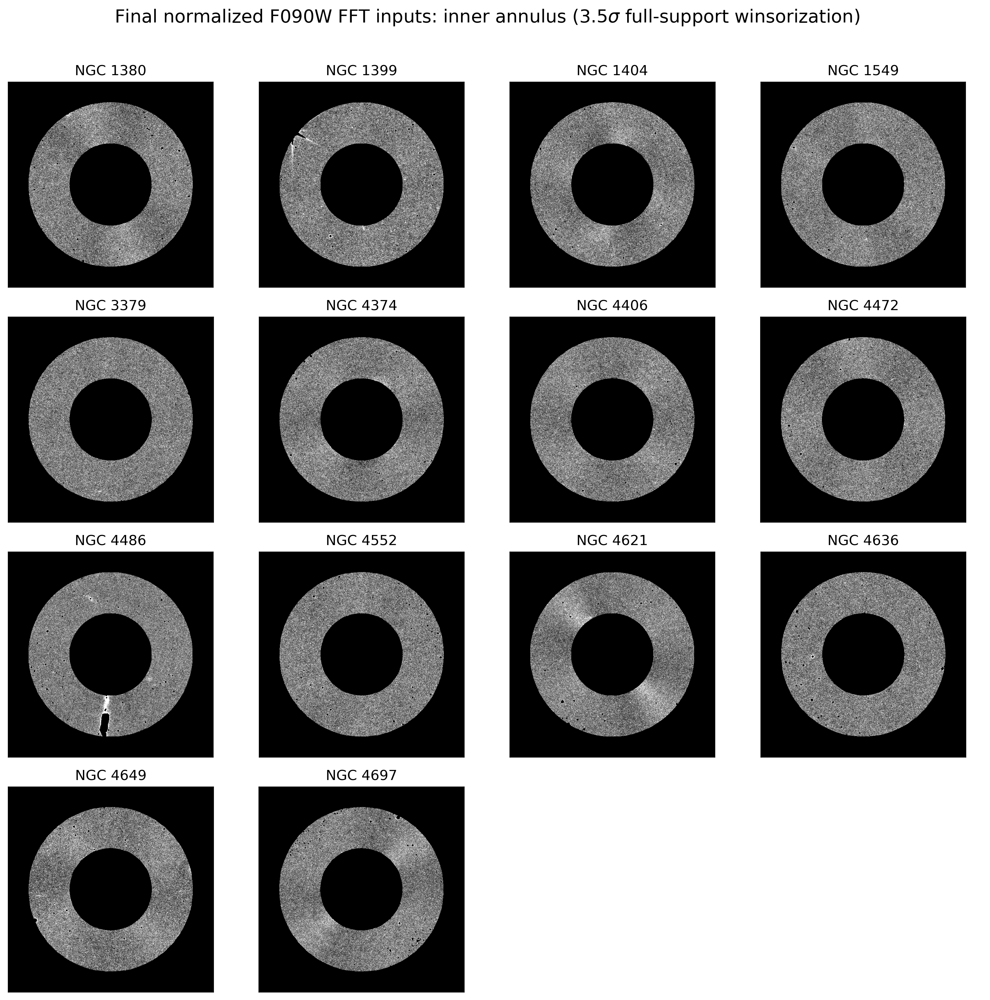

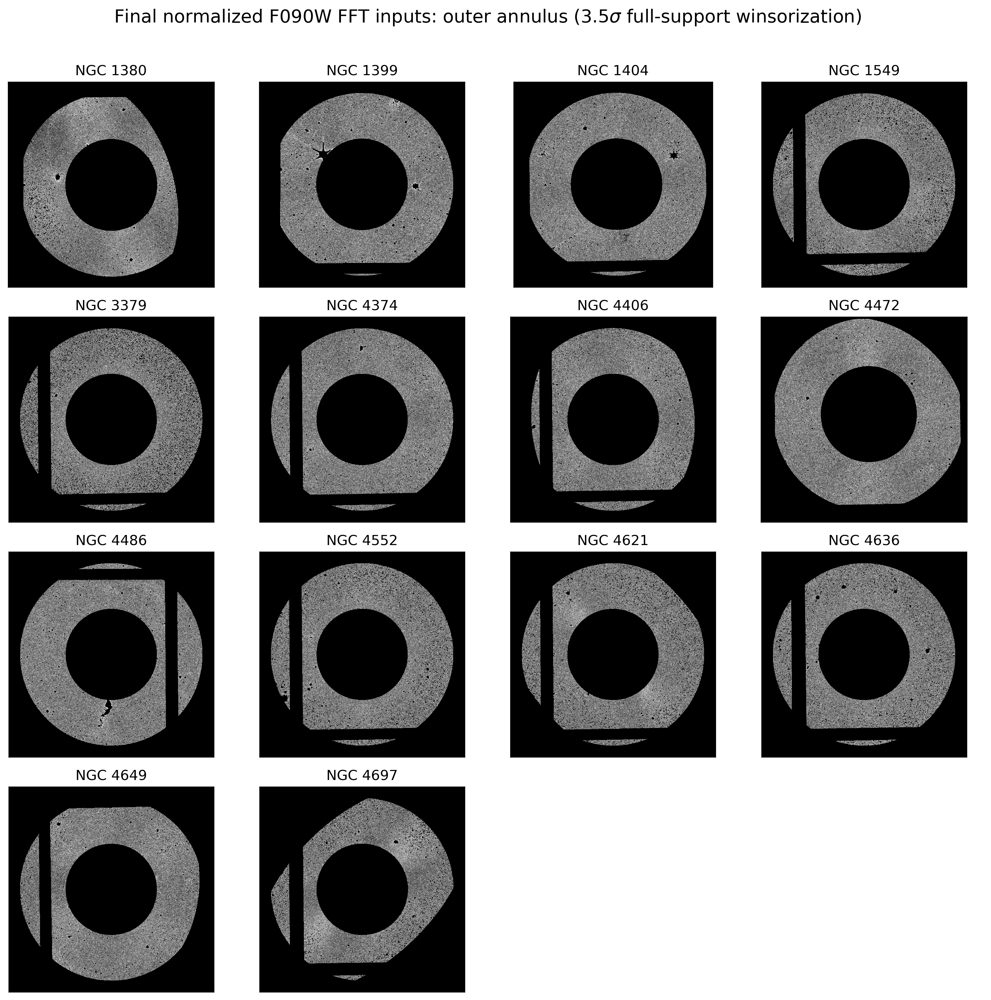

In [4]:
gray = mpl.colormaps["gray"].copy()
gray.set_bad("black")
for ring, path_column in [("inner", "normalized_inner_fits"),
                          ("outer", "normalized_outer_fits")]:
    panels = []
    for row in master.itertuples(index=False):
        image = np.asarray(fits.getdata(getattr(row, path_column)), float)[::2, ::2]
        scale = np.nanpercentile(np.abs(image), 99.4)
        panels.append((row.galaxy, image, scale))

    fig, axes = plt.subplots(4, 4, figsize=(12.5, 12.5))
    for ax, (galaxy, image, scale) in zip(axes.flat, panels):
        ax.set_facecolor("black")
        ax.imshow(np.ma.masked_invalid(image), origin="lower", cmap=gray,
                  vmin=-scale, vmax=scale, interpolation="nearest")
        ax.set_title(galaxy)
        ax.set(xticks=[], yticks=[])
    for ax in axes.flat[len(panels):]:
        ax.axis("off")
    fig.suptitle(
        rf"Final normalized F090W FFT inputs: {ring} annulus "
        rf"(3.5$\sigma$ full-support winsorization)", fontsize=16,
    )
    fig.tight_layout(rect=[0, 0, 1, 0.97])
    save_show(fig, f"go3055_f090w_final_fft_inputs_{ring}")

## 4. Единый статистический фит

Все формы ниже подгоняются одним likelihood. Он учитывает индивидуальные
ошибки по Y, ошибки цвета по X, локальную производную модели и свободный
внутренний разброс $\sigma_{\rm int}$. Ковариация предусмотрена явно; для
текущих точек F090W она равна нулю из-за сокращения общего $A_{090}$.

Центр цвета фиксирован одним числом для всех сравнений. Экспоненциальная
кривизна использует фиксированный масштаб 0.05 mag, чтобы не вводить
вырожденную четвёртую нелинейную степень свободы.

In [5]:
MODEL_LABELS = {
    "constant": "Constant",
    "linear": "Linear",
    "quadratic": "Quadratic",
    "cubic": "Cubic polynomial",
    "logarithmic": "Logarithmic",
    "log_quadratic": "Quadratic in log(color)",
    "exponential": "Exponential curvature",
}
MODEL_ORDER = list(MODEL_LABELS)
COLOR_CENTER = float(master["color_F090W_F150W"].median())
EXP_SCALE = 0.05

def model_basis(model, color, center=COLOR_CENTER):
    color = np.asarray(color, float)
    dx = color - center
    if model == "constant":
        return np.column_stack([np.ones_like(color)])
    if model == "linear":
        return np.column_stack([np.ones_like(color), dx])
    if model == "quadratic":
        return np.column_stack([np.ones_like(color), dx, dx**2])
    if model == "cubic":
        return np.column_stack([np.ones_like(color), dx, dx**2, dx**3])
    log_color = np.log(color / center)
    if model == "logarithmic":
        return np.column_stack([np.ones_like(color), log_color])
    if model == "log_quadratic":
        return np.column_stack([np.ones_like(color), log_color, log_color**2])
    if model == "exponential":
        curvature = np.exp(dx / EXP_SCALE) - 1 - dx / EXP_SCALE
        return np.column_stack([np.ones_like(color), dx, curvature])
    raise ValueError(f"Неизвестная модель: {model}")

def model_derivative(model, color, coefficients, center=COLOR_CENTER):
    color = np.asarray(color, float)
    dx = color - center
    if model == "constant":
        return np.zeros_like(color)
    if model == "linear":
        return np.full_like(color, coefficients[1])
    if model == "quadratic":
        return coefficients[1] + 2 * coefficients[2] * dx
    if model == "cubic":
        return coefficients[1] + 2 * coefficients[2] * dx + 3 * coefficients[3] * dx**2
    log_color = np.log(color / center)
    if model == "logarithmic":
        return coefficients[1] / color
    if model == "log_quadratic":
        return (coefficients[1] + 2 * coefficients[2] * log_color) / color
    if model == "exponential":
        return coefficients[1] + coefficients[2] * (np.exp(dx / EXP_SCALE) - 1) / EXP_SCALE
    raise ValueError(f"Неизвестная модель: {model}")

def predict_model(fit, color, is_fornax=0):
    scalar_input = np.asarray(color).ndim == 0
    prediction = model_basis(fit["model"], color, fit["color_center"]) @ fit["coefficients"]
    if fit["cluster_step"]:
        prediction = prediction + fit["delta_fornax"] * np.asarray(is_fornax, float)
    return float(np.ravel(prediction)[0]) if scalar_input else prediction

def fit_model(frame, model="linear", *, use_color_errors=True,
              color_error_column="sigma_color_adopted_mag", cluster_step=False):
    data = frame.dropna(subset=["color_F090W_F150W", "Mbar_F090W", "sigma_Mbar_F090W"]).copy()
    x = data["color_F090W_F150W"].to_numpy(float)
    y = data["Mbar_F090W"].to_numpy(float)
    sy = data["sigma_Mbar_F090W"].to_numpy(float)
    sx = data[color_error_column].fillna(0).to_numpy(float) if use_color_errors else np.zeros(len(data))
    covariance = data["cov_color_Mbar"].fillna(0).to_numpy(float) if use_color_errors else np.zeros(len(data))
    basis = model_basis(model, x, COLOR_CENTER)
    is_fornax = data["environment"].eq("Fornax").to_numpy(float)
    design = np.column_stack([basis, is_fornax]) if cluster_step else basis
    start_coefficients = np.linalg.lstsq(design, y, rcond=None)[0]
    start = np.r_[start_coefficients, np.log(0.05)]

    def objective(parameters):
        coefficients = parameters[:basis.shape[1]]
        prediction = basis @ coefficients
        if cluster_step:
            prediction += parameters[basis.shape[1]] * is_fornax
        derivative = model_derivative(model, x, coefficients, COLOR_CENTER)
        variance = sy**2 + (derivative * sx)**2 - 2 * derivative * covariance + np.exp(2 * parameters[-1])
        variance = np.clip(variance, 1e-12, None)
        return 0.5 * np.sum(np.log(2 * np.pi * variance) + (y - prediction)**2 / variance)

    bounds = [(None, None)] * (len(start) - 1) + [(np.log(1e-5), np.log(1.0))]
    solution = minimize(objective, start, method="L-BFGS-B", bounds=bounds)
    if not solution.success:
        raise RuntimeError(solution.message)

    n_parameters = len(start)
    n = len(data)
    aic = 2 * n_parameters + 2 * solution.fun
    coefficients = solution.x[:basis.shape[1]]
    result = {
        "model": model,
        "n": n,
        "n_parameters": n_parameters,
        "color_center": COLOR_CENTER,
        "coefficients": coefficients,
        "intercept": coefficients[0],
        "slope_at_center": float(model_derivative(model, COLOR_CENTER, coefficients, COLOR_CENTER)),
        "sigma_int": float(np.exp(solution.x[-1])),
        "aic": float(aic),
        "aicc": float(aic + 2 * n_parameters * (n_parameters + 1) / (n - n_parameters - 1))
                if n > n_parameters + 1 else np.inf,
        "cluster_step": cluster_step,
        "delta_fornax": float(solution.x[basis.shape[1]]) if cluster_step else 0.0,
        "color_error_column": color_error_column if use_color_errors else "ignored",
    }
    return result

def loo_predictions(frame, model):
    rows = []
    for index, target in frame.iterrows():
        fit = fit_model(frame.drop(index=index), model=model)
        predicted = predict_model(fit, target["color_F090W_F150W"])
        rows.append({
            "galaxy": target["galaxy"],
            "predicted_Mbar": predicted,
            "mu_sbf": target["mbar_F090W_0"] - predicted,
            "mu_trgb": target["mu_lit"],
            "residual_mag": target["mbar_F090W_0"] - predicted - target["mu_lit"],
        })
    return pd.DataFrame(rows)

def bootstrap_band(frame, model, x_grid, seed):
    rng = np.random.default_rng(seed)
    curves, scatters = [], []
    for _ in range(N_BAND_BOOTSTRAP):
        draw = frame.iloc[rng.integers(0, len(frame), len(frame))]
        try:
            fit = fit_model(draw, model=model)
            curve = predict_model(fit, x_grid)
            if np.isfinite(curve).all():
                curves.append(curve)
                scatters.append(fit["sigma_int"])
        except (ValueError, RuntimeError, np.linalg.LinAlgError):
            pass
    curves = np.asarray(curves)
    scatters = np.asarray(scatters)
    if len(curves) < N_BAND_BOOTSTRAP // 2:
        raise RuntimeError(f"Для {model} успешно только {len(curves)} bootstrap-реализаций")
    confidence = np.quantile(curves, [0.16, 0.84], axis=0)
    predictive = curves + rng.normal(size=(len(curves), 1)) * scatters[:, None]
    predictive = np.quantile(predictive, [0.16, 0.84], axis=0)
    return confidence, predictive, len(curves)

def bootstrap_parameters(frame, model, seed):
    rng = np.random.default_rng(seed)
    rows = []
    for _ in range(N_BAND_BOOTSTRAP):
        draw = frame.iloc[rng.integers(0, len(frame), len(frame))]
        try:
            fit = fit_model(draw, model=model)
            row = {
                "slope_at_center": fit["slope_at_center"],
                "sigma_int": fit["sigma_int"],
            }
            row.update({f"coefficient_{index}": value
                        for index, value in enumerate(fit["coefficients"])})
            rows.append(row)
        except (ValueError, RuntimeError, np.linalg.LinAlgError):
            pass
    result = pd.DataFrame(rows)
    if len(result) < N_BAND_BOOTSTRAP // 2:
        raise RuntimeError(f"Для {model} успешно только {len(result)} bootstrap-фитов")
    return result

def draw_points(ax, frame, annotate=True):
    for environment, group in frame.groupby("environment", sort=False):
        style = environment_style[environment]
        ax.errorbar(group["color_F090W_F150W"], group["Mbar_F090W"],
                    xerr=group["sigma_color_adopted_mag"], yerr=group["sigma_Mbar_F090W"],
                    fmt="none", ecolor=style["color"], elinewidth=1, capsize=2, zorder=1)
        ax.scatter(group["color_F090W_F150W"], group["Mbar_F090W"],
                   marker=style["marker"], color=style["color"], edgecolor="black",
                   linewidth=0.7, s=58, label=environment, zorder=3)
    if annotate:
        for row in frame.itertuples(index=False):
            ax.annotate(row.galaxy.replace("NGC ", ""),
                        (row.color_F090W_F150W, row.Mbar_F090W),
                        xytext=(4, 4), textcoords="offset points", fontsize=7)

def plot_color_model(model, filename):
    fit = model_fits[model]
    x_grid = np.linspace(master["color_F090W_F150W"].min() - 0.012,
                         master["color_F090W_F150W"].max() + 0.012, 300)
    confidence, predictive, success = bootstrap_band(master, model, x_grid, RNG_SEED + MODEL_ORDER.index(model))
    fig, ax = plt.subplots(figsize=(7.4, 5.5))
    ax.fill_between(x_grid, predictive[0], predictive[1], color="0.75", alpha=0.28,
                    linewidth=0, label="68% predictive band")
    ax.fill_between(x_grid, confidence[0], confidence[1], color="0.45", alpha=0.35,
                    linewidth=0, label="68% confidence band")
    ax.plot(x_grid, predict_model(fit, x_grid), color="black", lw=2.1,
            label=MODEL_LABELS[model])
    draw_points(ax, master)
    row = model_comparison.set_index("model").loc[model]
    ax.text(0.03, 0.04,
            f"AICc = {row.aicc:.2f}\nLOO RMS = {row.loo_rms_mag:.3f} mag\n"
            f"$\\sigma_{{int}}$ = {row.sigma_int_mag:.3f} mag\nbootstrap = {success}",
            transform=ax.transAxes, fontsize=8.5,
            bbox={"facecolor": "white", "alpha": 0.86, "edgecolor": "0.8"})
    ax.set(xlabel=r"$(F090W-F150W)_0$ (mag)",
           ylabel=r"$\overline{M}_{090}$ (mag)",
           title=f"F090W SBF calibration: {MODEL_LABELS[model]}")
    ax.invert_yaxis()
    handles, labels = ax.get_legend_handles_labels()
    unique = dict(zip(labels, handles))
    ax.legend(unique.values(), unique.keys(), frameon=False, ncol=2, loc="best")
    fig.tight_layout()
    save_show(fig, filename)

## 5. Сравнение форм зависимости на всех 14 галактиках

Основные критерии — AICc и ошибка LOO, а не визуальная гладкость. У модели
с меньшим AICc лучше баланс качества и числа параметров; LOO показывает,
насколько хорошо закон предсказывает по одной не участвовавшей в фите
галактике. В таблице также сохраняются все коэффициенты базиса и их
bootstrap-ошибки; нулевой коэфициент — значение в центре цветового диапазона.

In [6]:
model_fits = {}
model_loo = {}
comparison_rows = []
for model_index, model in enumerate(MODEL_ORDER):
    fit = fit_model(master, model=model)
    loo = loo_predictions(master, model)
    parameter_draws = bootstrap_parameters(master, model, RNG_SEED + 100 + model_index)
    model_fits[model] = fit
    model_loo[model] = loo
    residual = loo["residual_mag"].to_numpy(float)
    row = {
        "model": model,
        "description": MODEL_LABELS[model],
        "n_parameters": fit["n_parameters"],
        "intercept_mag": fit["intercept"],
        "intercept_sigma_bootstrap_mag": parameter_draws["coefficient_0"].std(ddof=1),
        "slope_at_center": fit["slope_at_center"],
        "slope_sigma_bootstrap": parameter_draws["slope_at_center"].std(ddof=1),
        "sigma_int_mag": fit["sigma_int"],
        "aicc": fit["aicc"],
        "loo_bias_mag": residual.mean(),
        "loo_rms_mag": np.sqrt(np.mean(residual**2)),
        "loo_median_abs_mag": np.median(np.abs(residual)),
        "bootstrap_success": len(parameter_draws),
    }
    for coefficient_index, coefficient in enumerate(fit["coefficients"]):
        column = f"coefficient_{coefficient_index}"
        row[column] = coefficient
        row[f"{column}_sigma_bootstrap"] = parameter_draws[column].std(ddof=1)
    comparison_rows.append(row)

model_comparison = pd.DataFrame(comparison_rows)
model_comparison["delta_aicc"] = model_comparison["aicc"] - model_comparison["aicc"].min()
model_comparison = model_comparison.sort_values("aicc").reset_index(drop=True)
model_comparison.to_csv(TABLE_DIR / "go3055_f090w_color_model_comparison.csv", index=False)
display(model_comparison.round(4))

,model,description,n_parameters,intercept_mag,intercept_sigma_bootstrap_mag,slope_at_center,slope_sigma_bootstrap,sigma_int_mag,aicc,loo_bias_mag,loo_rms_mag,loo_median_abs_mag,bootstrap_success,coefficient_0,coefficient_0_sigma_bootstrap,coefficient_1,coefficient_1_sigma_bootstrap,coefficient_2,coefficient_2_sigma_bootstrap,coefficient_3,coefficient_3_sigma_bootstrap,delta_aicc
0,logarithmic,Logarithmic,3,-1.9593,0.0170,1.9166,0.4641,0.0482,-31.3124,-0.0035,0.0673,0.0506,400,-1.9593,0.0170,1.0930,0.2647,NaN,NaN,NaN,NaN,0.0000
1,linear,Linear,3,-1.9617,0.0157,1.8890,0.4424,0.0489,-30.9839,-0.0039,0.0684,0.0546,400,-1.9617,0.0157,1.8890,0.4424,NaN,NaN,NaN,NaN,0.3285
2,log_quadratic,Quadratic in log(color),4,-1.9469,0.0185,1.9538,0.9987,0.0468,-28.0604,0.0003,0.0684,0.0486,400,-1.9469,0.0185,1.1141,0.5695,-2.7898,6.0609,NaN,NaN,3.2520
3,quadratic,Quadratic,4,-1.9476,0.0178,2.0052,0.9070,0.0469,-28.0011,0.0002,0.0682,0.0468,400,-1.9476,0.0178,2.0052,0.9070,-9.8442,17.1007,NaN,NaN,3.3113
4,exponential,Exponential curvature,4,-1.9517,0.0190,2.1287,0.8951,0.0475,-27.6892,-0.0002,0.0681,0.0439,400,-1.9517,0.0190,2.1287,0.8951,-0.0302,0.0789,NaN,NaN,3.6232
5,cubic,Cubic polynomial,5,-1.9447,0.0199,1.5478,2.0223,0.0462,-23.2259,-0.0141,0.0942,0.0716,400,-1.9447,0.0199,1.5478,2.0223,-12.4008,47.8607,143.4055,913.4154,8.0865
6,constant,Constant,2,-1.9491,0.0244,0.0000,0.0000,0.0864,-21.8387,0.0014,0.0992,0.0688,400,-1.9491,0.0244,NaN,NaN,NaN,NaN,NaN,NaN,9.4737


### 5.1. Постоянная калибровка

Нулевая гипотеза: абсолютная SBF-величина F090W не зависит от цвета.

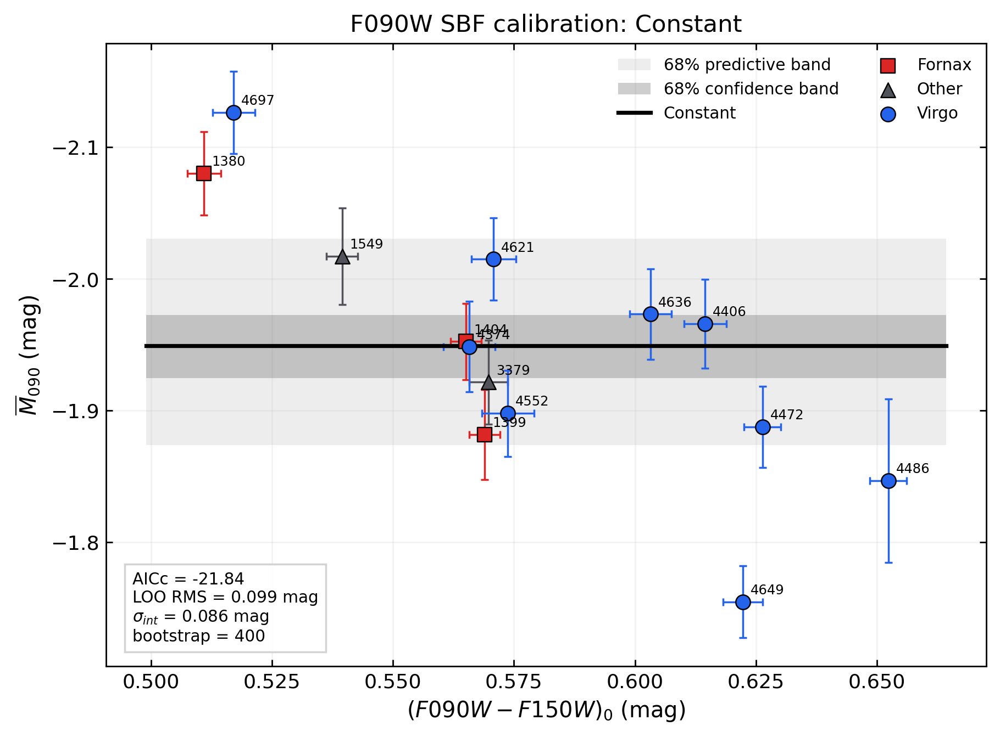

In [7]:
plot_color_model('constant', 'go3055_f090w_model_constant')

### 5.2. Линейная калибровка

Основная проверка цветовой зависимости с одной дополнительной степенью свободы.

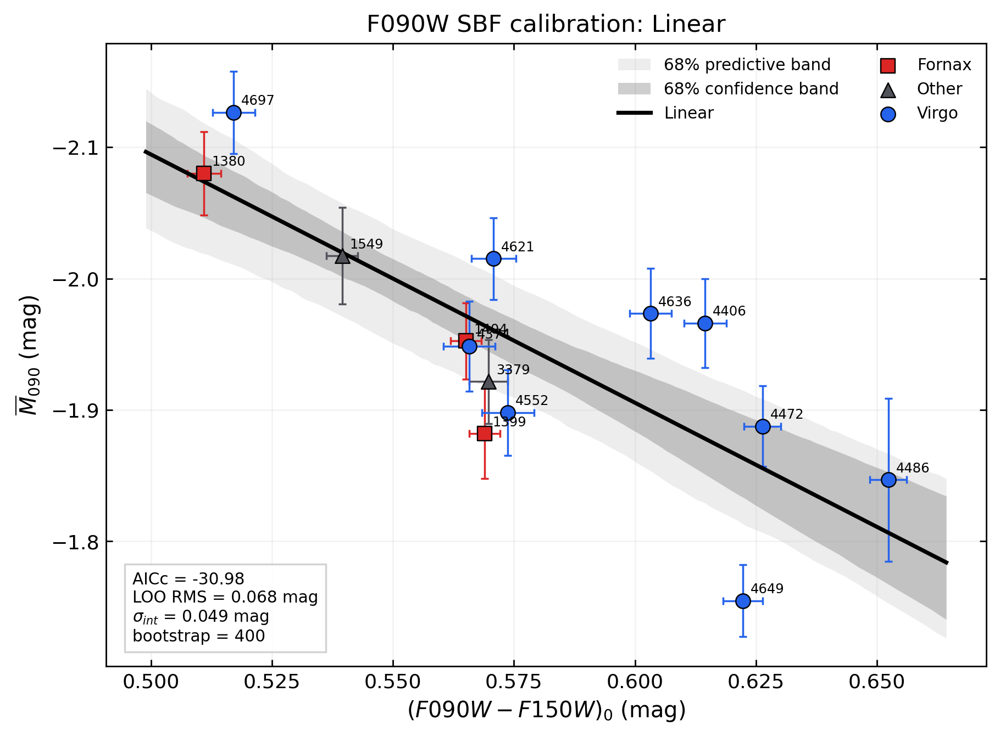

In [8]:
plot_color_model('linear', 'go3055_f090w_model_linear')

### 5.3. Квадратичная калибровка

Проверяет простую симметричную кривизну. При 14 точках штраф AICc уже существенен.

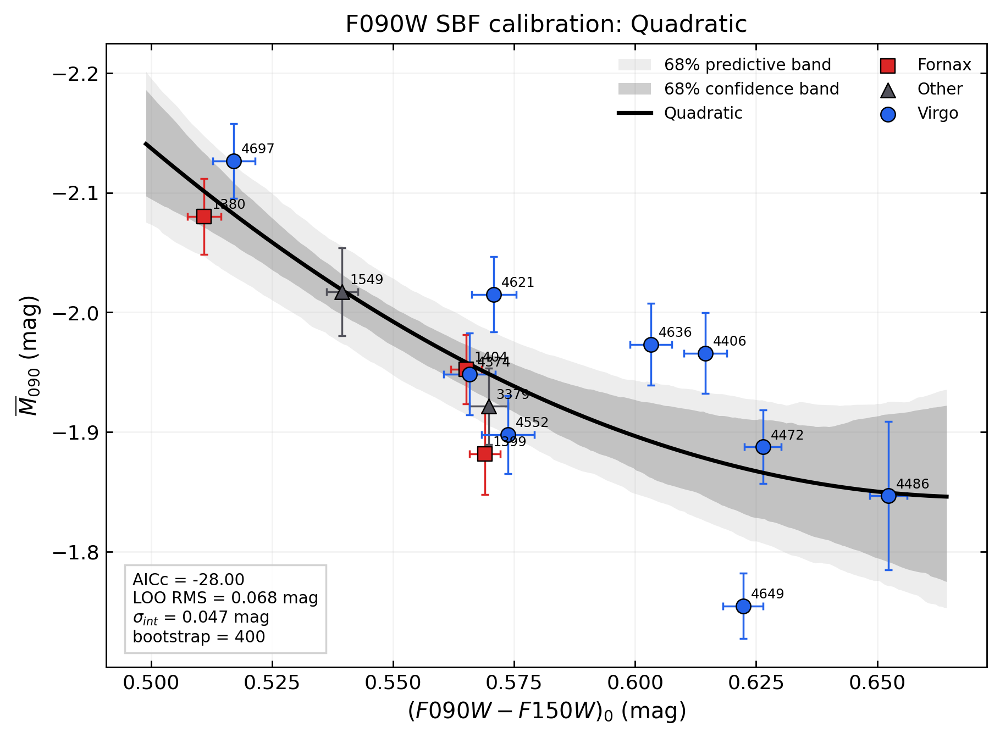

In [9]:
plot_color_model('quadratic', 'go3055_f090w_model_quadratic')

### 5.4. Кубический полином

Гибкая исследовательская модель; особенно уязвима к переобучению на краях диапазона.

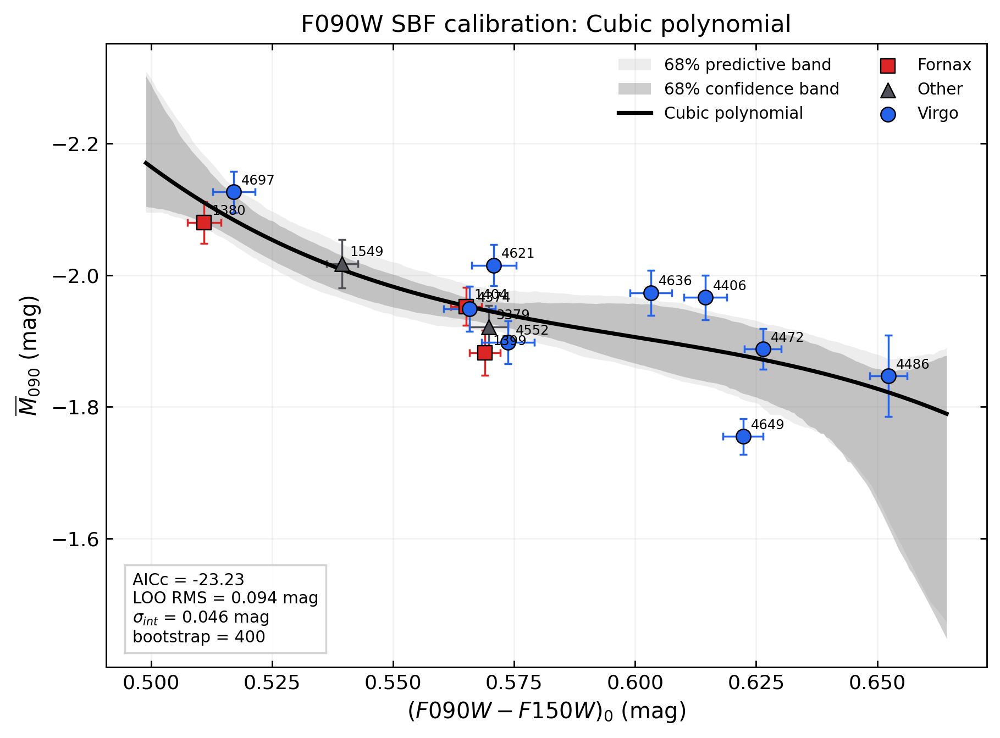

In [10]:
plot_color_model('cubic', 'go3055_f090w_model_cubic')

### 5.5. Логарифмическая зависимость

Линейный закон относительно $\ln(C/C_0)$.

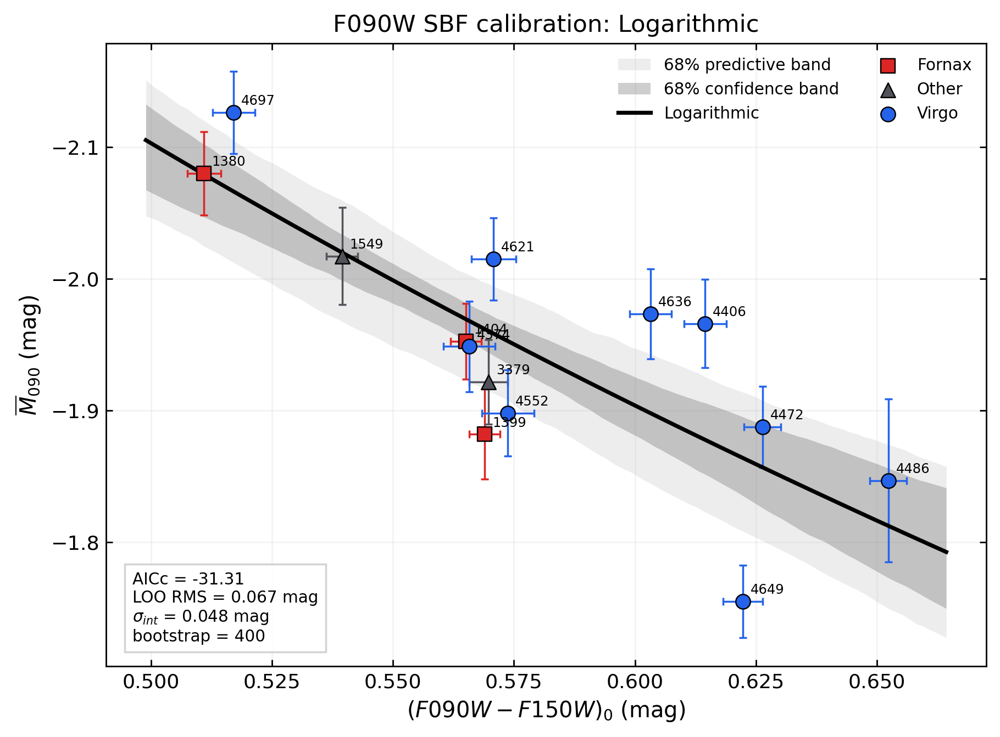

In [11]:
plot_color_model('logarithmic', 'go3055_f090w_model_logarithmic')

### 5.6. Квадратичная зависимость от логарифма цвета

Допускает кривизну уже в логарифмической координате.

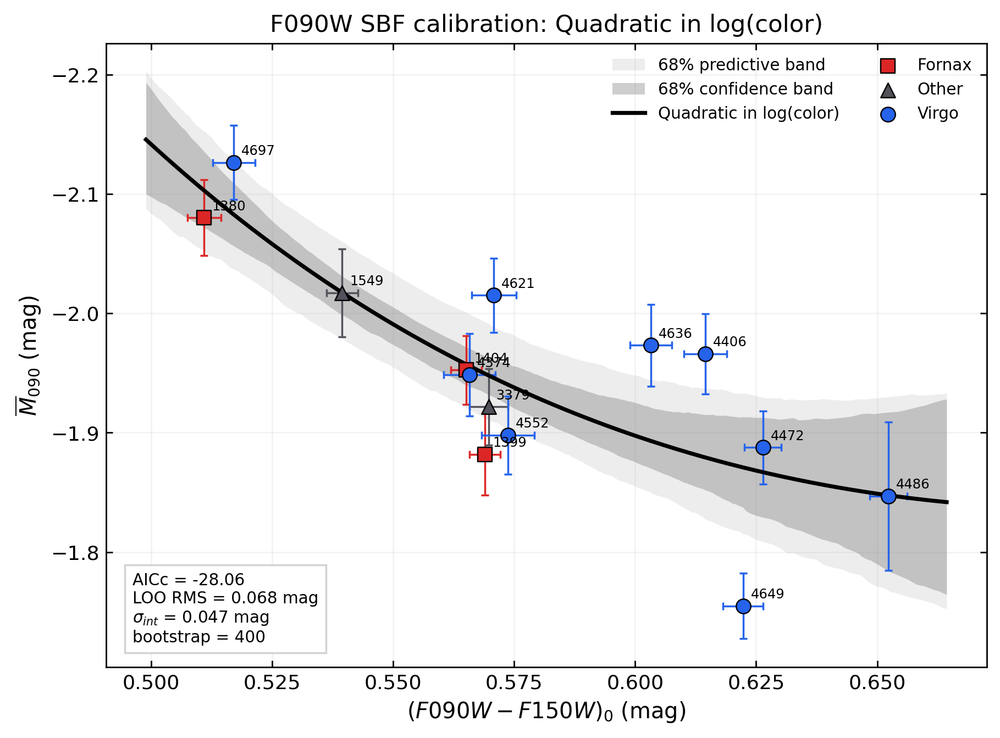

In [12]:
plot_color_model('log_quadratic', 'go3055_f090w_model_log_quadratic')

### 5.7. Экспоненциальная кривизна

Наклон и односторонняя экспоненциальная поправка; масштаб кривизны фиксирован.

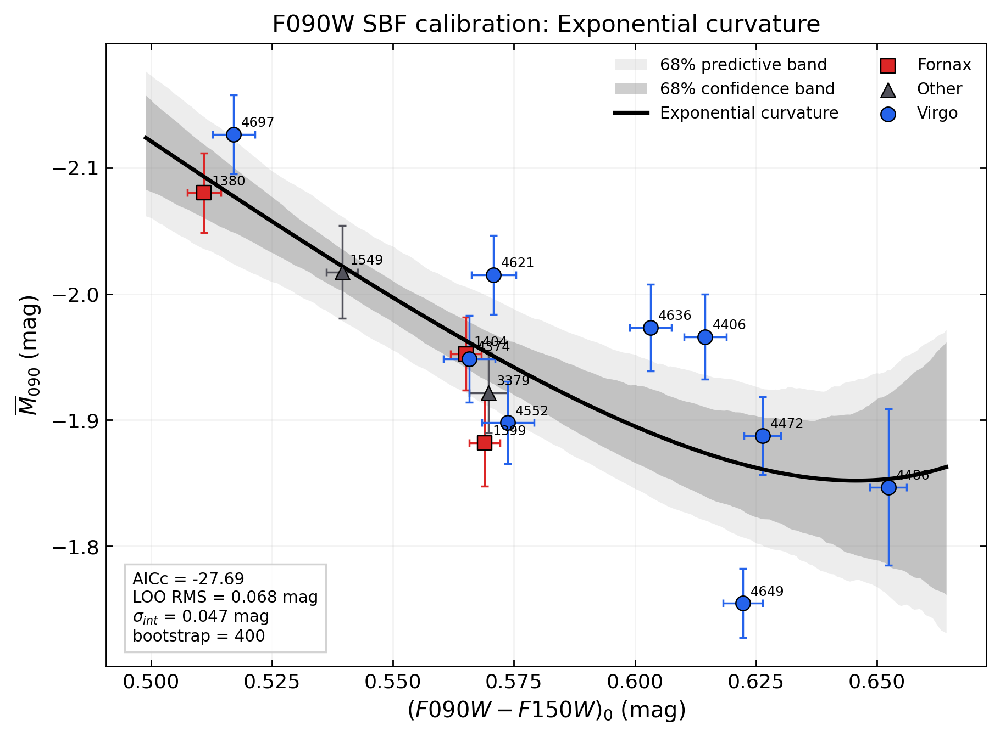

In [13]:
plot_color_model('exponential', 'go3055_f090w_model_exponential')

## 6. Четыре заранее заданные выборки

Главный результат всегда использует 14/14 без ручных исключений. Три
дополнительные панели — только проверка чувствительности. Оценки
`visual_clean` и `automatic_clean` были зафиксированы по остаткам F150W;
здесь они не переименовываются в независимую F090W-классификацию.

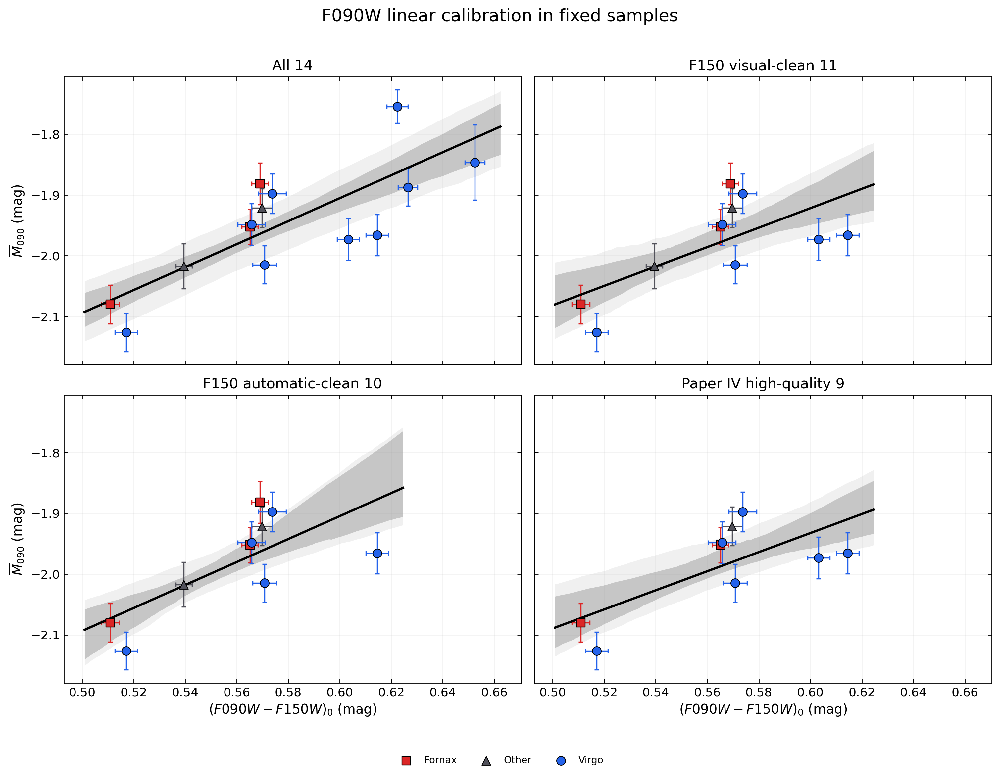

,sample,n,linear_slope,pearson_r,pearson_p,spearman_rho,spearman_p,delta_aicc_linear_minus_constant,constant_loo_rms_mag,linear_loo_rms_mag
0,All 14,14,1.8890,0.7761,0.0011,0.7011,0.0052,-9.1452,0.0992,0.0684
1,F150 visual-clean 11,11,1.5963,0.6604,0.0270,0.4727,0.1420,-2.4875,0.0784,0.0677
2,F150 automatic-clean 10,10,1.8891,0.7135,0.0205,0.5879,0.0739,-2.9392,0.0830,0.0745
3,Paper IV high-quality 9,9,1.5686,0.7020,0.0350,0.3833,0.3085,-1.4216,0.0791,0.0656


In [14]:
samples = {
    "All 14": master.copy(),
    "F150 visual-clean 11": master[master["include_visual_clean"]].copy(),
    "F150 automatic-clean 10": master[master["include_residual_clean"]].copy(),
    "Paper IV high-quality 9": master[master["include_paper_iv_high_quality"]].copy(),
}

sample_rows = []
fig, axes = plt.subplots(2, 2, figsize=(12.2, 9.4), sharex=True, sharey=True)
for panel, (ax, (sample_name, sample)) in enumerate(zip(axes.flat, samples.items())):
    constant_fit = fit_model(sample, model="constant")
    linear_fit = fit_model(sample, model="linear")
    constant_loo = loo_predictions(sample, "constant")
    linear_loo = loo_predictions(sample, "linear")
    pearson = pearsonr(sample["color_F090W_F150W"], sample["Mbar_F090W"])
    spearman = spearmanr(sample["color_F090W_F150W"], sample["Mbar_F090W"])
    sample_rows.append({
        "sample": sample_name, "n": len(sample),
        "linear_slope": linear_fit["slope_at_center"],
        "pearson_r": pearson.statistic, "pearson_p": pearson.pvalue,
        "spearman_rho": spearman.statistic, "spearman_p": spearman.pvalue,
        "delta_aicc_linear_minus_constant": linear_fit["aicc"] - constant_fit["aicc"],
        "constant_loo_rms_mag": np.sqrt(np.mean(constant_loo["residual_mag"]**2)),
        "linear_loo_rms_mag": np.sqrt(np.mean(linear_loo["residual_mag"]**2)),
    })
    grid = np.linspace(sample["color_F090W_F150W"].min() - 0.01,
                       sample["color_F090W_F150W"].max() + 0.01, 250)
    confidence, predictive, _ = bootstrap_band(sample, "linear", grid, RNG_SEED + 20 + panel)
    ax.fill_between(grid, predictive[0], predictive[1], color="0.78", alpha=0.25, linewidth=0)
    ax.fill_between(grid, confidence[0], confidence[1], color="0.48", alpha=0.35, linewidth=0)
    ax.plot(grid, predict_model(linear_fit, grid), color="black", lw=2)
    draw_points(ax, sample, annotate=False)
    ax.set_title(sample_name)
    ax.invert_yaxis()
for ax in axes[-1]:
    ax.set_xlabel(r"$(F090W-F150W)_0$ (mag)")
for ax in axes[:, 0]:
    ax.set_ylabel(r"$\overline{M}_{090}$ (mag)")
handles, labels = axes[0, 0].get_legend_handles_labels()
unique = dict(zip(labels, handles))
fig.legend(unique.values(), unique.keys(), frameon=False, loc="lower center", ncol=3)
fig.suptitle("F090W linear calibration in fixed samples", fontsize=15)
fig.tight_layout(rect=[0, 0.05, 1, 0.97])
save_show(fig, "go3055_f090w_fixed_samples")

sample_comparison = pd.DataFrame(sample_rows)
sample_comparison.to_csv(TABLE_DIR / "go3055_f090w_fixed_sample_comparison.csv", index=False)
display(sample_comparison.round(4))

## 7. Ошибки цвета и ковариация

Сравниваются: полное игнорирование горизонтальных ошибок, принятая
фотометрия + поглощение, дополнительный floor 0.01 mag и консервативная
подстановка радиальной разницы цветов. Последняя не является чистой
фотометрической ошибкой и используется только как стресс-тест.

Для точки калибровки $\operatorname{cov}(C,\overline M_{090})=0$ по члену
поглощения: один и тот же $A_{090}$ сокращается между SBF и TRGB. При
применении к новой галактике ковариация учитывается не отдельным знаком, а
эквивалентной производной
$\sigma_{\rm ext}=|R_{090}-f'(C)(R_{090}-R_{150})|\sigma_E$.

In [15]:
color_error_cases = [
    ("Ignored", False, "sigma_color_adopted_mag"),
    ("Adopted", True, "sigma_color_adopted_mag"),
    ("0.01 mag floor", True, "sigma_color_floor_mag"),
    ("Radial proxy", True, "sigma_color_radial_proxy_mag"),
]
color_error_rows = []
for label, use_errors, column in color_error_cases:
    fit = fit_model(master, model="linear", use_color_errors=use_errors,
                    color_error_column=column)
    color_error_rows.append({
        "case": label, "slope": fit["slope_at_center"],
        "intercept": fit["intercept"], "sigma_int_mag": fit["sigma_int"],
        "aicc": fit["aicc"], "covariance_used": bool(use_errors),
    })
color_error_sensitivity = pd.DataFrame(color_error_rows)
color_error_sensitivity.to_csv(TABLE_DIR / "go3055_f090w_color_error_sensitivity.csv", index=False)
display(color_error_sensitivity.round(5))
print("Диапазон extinction-covariance точек калибровки:",
      master["cov_color_Mbar"].min(), master["cov_color_Mbar"].max(), "mag^2")

,case,slope,intercept,sigma_int_mag,aicc,covariance_used
0,Ignored,1.8884,-1.9617,0.0496,-30.9759,False
1,Adopted,1.8890,-1.9617,0.0489,-30.9839,True
2,0.01 mag floor,1.8890,-1.9617,0.0451,-30.9839,True
3,Radial proxy,1.9006,-1.9636,0.0463,-30.8150,True


Диапазон extinction-covariance точек калибровки: 0.0 0.0 mag^2


## 8. Внутреннее, внешнее и взвешенное измерения

Цвет каждого кольца взят из той же локальной круговой области F090W/F150W,
что использовалась в исходном F150W-анализе, и исправлен за поглощение.
Отдельные кольца сравниваются с итоговой взвешенной оценкой. Разница между
ними диагностирует радиальный градиент, но не объявляется автоматически
ошибкой.

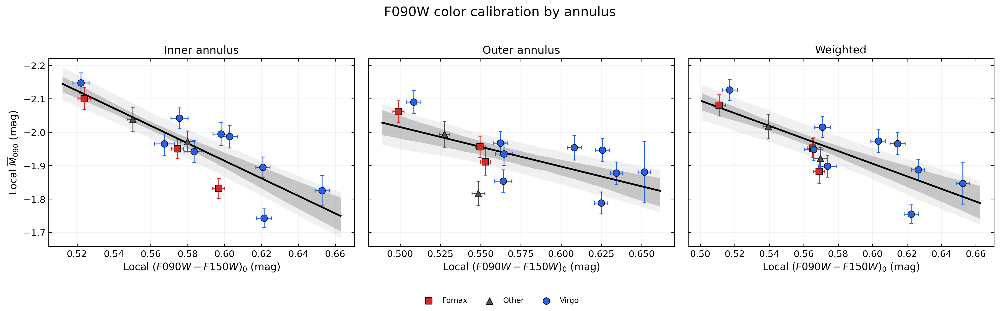

,measurement,linear_slope,linear_sigma_int,delta_aicc_linear_minus_constant,constant_loo_rms,linear_loo_rms
0,Inner annulus,2.6244,0.0471,-13.8261,0.1138,0.0655
1,Outer annulus,1.1824,0.0545,-3.3360,0.0888,0.0758
2,Weighted,1.8890,0.0489,-9.1452,0.0992,0.0684


Корреляция radial delta SBF с radial delta color:
Pearson: PearsonRResult(statistic=np.float64(-0.07254853196507838), pvalue=np.float64(0.8053207891119543))
Spearman: SignificanceResult(statistic=np.float64(-0.1252747252747253), pvalue=np.float64(0.6695823965448444))


In [16]:
annulus_rows = []
for row in master.itertuples(index=False):
    colors = pd.read_csv(color_path_by_galaxy[row.galaxy]).set_index("region")
    for ring, region in [("inner", "circular_inner_lit"), ("outer", "circular_outer_lit")]:
        color_row = colors.loc[region]
        mbar_observed = getattr(row, f"mbar_{ring}_observed")
        sigma_spectrum = getattr(row, f"{ring}_sigma_spectrum_no_psf_mag")
        sigma_psf = getattr(row, f"{ring}_sigma_psf_mag")
        sigma_pr = getattr(row, f"{ring}_sigma_Pr_mag")
        sigma_sky = getattr(row, f"{ring}_sigma_sky_mag")
        sigma_mbar = np.sqrt(sigma_spectrum**2 + sigma_psf**2 + sigma_pr**2 + sigma_sky**2)
        color_observed = float(color_row["color_F090W_F150W_observed"])
        color_corrected = color_observed - (row.A_F090W - row.A_F150W)
        sigma_color_measurement = float(color_row["color_sem_proxy"])
        annulus_rows.append({
            "galaxy": row.galaxy, "environment": row.environment, "annulus": ring,
            "color_F090W_F150W": color_corrected,
            "sigma_color_measurement_mag": sigma_color_measurement,
            "sigma_color_adopted_mag": np.hypot(sigma_color_measurement, row.sigma_color_extinction),
            "cov_color_Mbar": 0.0,
            "mbar_F090W_0": mbar_observed - row.A_F090W,
            "Mbar_F090W": mbar_observed - row.A_F090W - row.mu_lit,
            "sigma_Mbar_F090W": np.hypot(sigma_mbar, row.sigma_mu_without_reddening_mag),
            "mu_lit": row.mu_lit,
        })
annuli = pd.DataFrame(annulus_rows)

ring_samples = {
    "Inner annulus": annuli[annuli["annulus"].eq("inner")].copy(),
    "Outer annulus": annuli[annuli["annulus"].eq("outer")].copy(),
    "Weighted": master.copy(),
}
ring_rows = []
fig, axes = plt.subplots(1, 3, figsize=(16.0, 4.9), sharey=True)
for panel, (ax, (name, sample)) in enumerate(zip(axes, ring_samples.items())):
    constant_fit = fit_model(sample, "constant")
    linear_fit = fit_model(sample, "linear")
    constant_loo = loo_predictions(sample, "constant")
    linear_loo = loo_predictions(sample, "linear")
    ring_rows.append({
        "measurement": name, "linear_slope": linear_fit["slope_at_center"],
        "linear_sigma_int": linear_fit["sigma_int"],
        "delta_aicc_linear_minus_constant": linear_fit["aicc"] - constant_fit["aicc"],
        "constant_loo_rms": np.sqrt(np.mean(constant_loo["residual_mag"]**2)),
        "linear_loo_rms": np.sqrt(np.mean(linear_loo["residual_mag"]**2)),
    })
    grid = np.linspace(sample["color_F090W_F150W"].min() - 0.01,
                       sample["color_F090W_F150W"].max() + 0.01, 250)
    confidence, predictive, _ = bootstrap_band(sample, "linear", grid, RNG_SEED + 40 + panel)
    ax.fill_between(grid, predictive[0], predictive[1], color="0.78", alpha=0.25, linewidth=0)
    ax.fill_between(grid, confidence[0], confidence[1], color="0.48", alpha=0.35, linewidth=0)
    ax.plot(grid, predict_model(linear_fit, grid), color="black", lw=2)
    draw_points(ax, sample, annotate=False)
    ax.set(xlabel=r"Local $(F090W-F150W)_0$ (mag)", title=name)
    ax.invert_yaxis()
axes[0].set_ylabel(r"Local $\overline{M}_{090}$ (mag)")
handles, labels = axes[0].get_legend_handles_labels()
unique = dict(zip(labels, handles))
fig.legend(unique.values(), unique.keys(), frameon=False, loc="lower center", ncol=3)
fig.suptitle("F090W color calibration by annulus", fontsize=15)
fig.tight_layout(rect=[0, 0.08, 1, 0.96])
save_show(fig, "go3055_f090w_annulus_comparison")

ring_comparison = pd.DataFrame(ring_rows)
ring_comparison.to_csv(TABLE_DIR / "go3055_f090w_annulus_comparison.csv", index=False)
display(ring_comparison.round(4))

radial_test = annuli.pivot(index="galaxy", columns="annulus", values=["Mbar_F090W", "color_F090W_F150W"])
delta_mbar = radial_test["Mbar_F090W"]["outer"] - radial_test["Mbar_F090W"]["inner"]
delta_color = radial_test["color_F090W_F150W"]["outer"] - radial_test["color_F090W_F150W"]["inner"]
print("Корреляция radial delta SBF с radial delta color:")
print("Pearson:", pearsonr(delta_color, delta_mbar))
print("Spearman:", spearmanr(delta_color, delta_mbar))

## 9. Virgo/Fornax и влияние отдельных галактик

Ступенька проверяется только для строгих 7 Virgo + 3 Fornax. NGC 4636 и
NGC 4697 не используются в строгом cluster-step тесте. Перестановочный
p-value перебирает все способы назначить три метки Fornax десяти объектам.
Основная калибровка всё равно остаётся общей для 14 галактик.

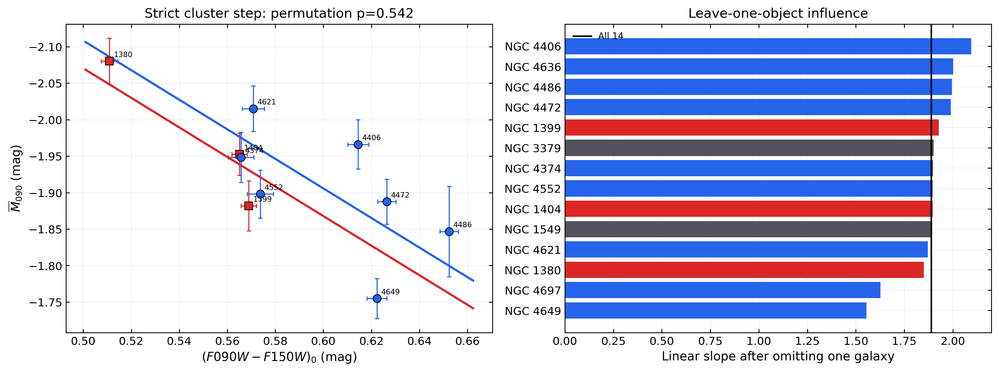

,n_strict,common_aicc,step_aicc,delta_aicc_step_minus_common,delta_fornax_mag,observed_residual_step_mag,exact_permutation_p
0,10,-17.7799,-12.262,5.5179,0.0379,0.0257,0.5417


,omitted_galaxy,environment,slope,intercept,sigma_int,aicc,delta_slope
12,NGC 4649,Virgo,1.5547,-1.9704,0.0372,-32.0615,-0.3343
13,NGC 4697,Virgo,1.6267,-1.9535,0.0477,-28.5105,-0.2623
6,NGC 4406,Virgo,2.0946,-1.9553,0.0436,-29.5609,0.2056
11,NGC 4636,Virgo,2.0025,-1.9564,0.0465,-28.6493,0.1135
8,NGC 4486,Virgo,1.9955,-1.9603,0.0496,-27.8105,0.1065
7,NGC 4472,Virgo,1.9894,-1.9593,0.0502,-27.2566,0.1004
1,NGC 1399,Fornax,1.9280,-1.9681,0.0462,-28.9947,0.0390
0,NGC 1380,Fornax,1.8514,-1.9608,0.0516,-26.9369,-0.0376
10,NGC 4621,Virgo,1.8717,-1.9572,0.0490,-27.8144,-0.0173
4,NGC 3379,Other,1.9015,-1.9651,0.0502,-27.4270,0.0125


In [17]:
strict_virgo = {"NGC 4374", "NGC 4406", "NGC 4472", "NGC 4486", "NGC 4552", "NGC 4621", "NGC 4649"}
strict_fornax = {"NGC 1380", "NGC 1399", "NGC 1404"}
strict = master[master["galaxy"].isin(strict_virgo | strict_fornax)].copy()

common_fit = fit_model(strict, "linear")
step_fit = fit_model(strict, "linear", cluster_step=True)
common_residual = strict["Mbar_F090W"].to_numpy() - predict_model(
    common_fit, strict["color_F090W_F150W"].to_numpy()
)
observed_mask = strict["environment"].eq("Fornax").to_numpy()
observed_step = common_residual[observed_mask].mean() - common_residual[~observed_mask].mean()
permuted_steps = []
for selected in combinations(range(len(strict)), len(strict_fornax)):
    mask = np.zeros(len(strict), bool)
    mask[list(selected)] = True
    permuted_steps.append(common_residual[mask].mean() - common_residual[~mask].mean())
permuted_steps = np.asarray(permuted_steps)
permutation_p = np.mean(np.abs(permuted_steps) >= abs(observed_step))

influence_rows = []
for index, target in master.iterrows():
    fit = fit_model(master.drop(index=index), "linear")
    influence_rows.append({
        "omitted_galaxy": target["galaxy"], "environment": target["environment"],
        "slope": fit["slope_at_center"], "intercept": fit["intercept"],
        "sigma_int": fit["sigma_int"], "aicc": fit["aicc"],
    })
influence = pd.DataFrame(influence_rows)
influence["delta_slope"] = influence["slope"] - model_fits["linear"]["slope_at_center"]

cluster_summary = pd.DataFrame([{
    "n_strict": len(strict),
    "common_aicc": common_fit["aicc"], "step_aicc": step_fit["aicc"],
    "delta_aicc_step_minus_common": step_fit["aicc"] - common_fit["aicc"],
    "delta_fornax_mag": step_fit["delta_fornax"],
    "observed_residual_step_mag": observed_step,
    "exact_permutation_p": permutation_p,
}])
cluster_summary.to_csv(TABLE_DIR / "go3055_f090w_cluster_systematics.csv", index=False)
influence.to_csv(TABLE_DIR / "go3055_f090w_influence.csv", index=False)

fig, axes = plt.subplots(1, 2, figsize=(13.2, 5.0))
draw_points(axes[0], strict)
grid = np.linspace(strict["color_F090W_F150W"].min() - 0.01,
                   strict["color_F090W_F150W"].max() + 0.01, 250)
axes[0].plot(grid, predict_model(step_fit, grid, 0), color="#2563eb", lw=2, label="Virgo")
axes[0].plot(grid, predict_model(step_fit, grid, 1), color="#dc2626", lw=2, label="Fornax")
axes[0].set(xlabel=r"$(F090W-F150W)_0$ (mag)", ylabel=r"$\overline{M}_{090}$ (mag)",
            title=f"Strict cluster step: permutation p={permutation_p:.3f}")
axes[0].invert_yaxis()

influence_plot = influence.sort_values("slope")
colors = influence_plot["environment"].map({key: value["color"] for key, value in environment_style.items()})
axes[1].barh(influence_plot["omitted_galaxy"], influence_plot["slope"], color=colors)
axes[1].axvline(model_fits["linear"]["slope_at_center"], color="black", lw=1.5,
                label="All 14")
axes[1].set(xlabel="Linear slope after omitting one galaxy",
            title="Leave-one-object influence")
axes[1].legend(frameon=False)
fig.tight_layout()
save_show(fig, "go3055_f090w_cluster_and_influence")
display(cluster_summary.round(4))
display(influence.sort_values("delta_slope", key=np.abs, ascending=False).round(4))

## 10. Расстояния: без цвета и с цветом

Каждая галактика предсказывается калибровкой по остальным 13 (LOO).
Случайная ошибка нового расстояния включает спектральное измерение, PSF,
фон, $P_r$, цвет, поглощение, внутренний разброс закона и конечность
калибровочной выборки. Общий нуль-пункт TRGB 0.047 mag указан отдельно и
затем включён в полную ошибку расстояния.

Для линейной/нелинейной модели вклад поглощения вычисляется совместно с
цветом, а не дважды:

$$\sigma_{\rm ext}=|R_{090}-f'(C)(R_{090}-R_{150})|\,\sigma_{E(B-V)}.$$

In [18]:
distance_rows = []
for model_index, model in enumerate(["constant", "linear"]):
    for index, target in master.iterrows():
        training = master.drop(index=index)
        fit = fit_model(training, model)
        color = target["color_F090W_F150W"]
        predicted_Mbar = predict_model(fit, color)
        derivative = float(model_derivative(model, color, fit["coefficients"], fit["color_center"]))

        rng = np.random.default_rng(RNG_SEED + 1000 * model_index + index)
        predictions = []
        for _ in range(N_DISTANCE_BOOTSTRAP):
            draw = training.iloc[rng.integers(0, len(training), len(training))]
            try:
                draw_fit = fit_model(draw, model)
                predictions.append(predict_model(draw_fit, color))
            except (ValueError, RuntimeError, np.linalg.LinAlgError):
                pass
        sigma_calibration = float(np.std(predictions, ddof=1))

        sigma_color_measurement = abs(derivative) * target["sigma_color_measurement_mag"]
        sigma_extinction = abs(A_F090W_PER_EBV - derivative * DELTA_R) * target["sigma_E_BV"]
        components = {
            "sigma_measurement_mag": target["sigma_measurement_mag"],
            "sigma_psf_mag": target["sigma_psf_mag"],
            "sigma_sky_mag": target["sigma_sky_mag"],
            "sigma_Pr_mag": target["sigma_Pr_mag"],
            "sigma_color_measurement_mag": sigma_color_measurement,
            "sigma_extinction_mag": sigma_extinction,
            "sigma_intrinsic_mag": fit["sigma_int"],
            "sigma_calibration_mag": sigma_calibration,
        }
        sigma_internal = float(np.sqrt(sum(value**2 for value in components.values())))
        sigma_total = float(np.hypot(sigma_internal, TRGB_COMMON_ZEROPOINT_MAG))
        mu_sbf = target["mbar_F090W_0"] - predicted_Mbar
        distance_mpc = 10 ** ((mu_sbf - 25) / 5)
        sigma_distance_mpc = np.log(10) / 5 * distance_mpc * sigma_total

        # Ошибка именно LOO-разности относительно Paper IV: общий A090 и
        # общий нуль-пункт сокращаются, остаётся цветовая часть reddening.
        sigma_validation = np.sqrt(
            target["sigma_mbar_internal"]**2
            + (derivative * target["sigma_color_measurement_mag"])**2
            + (derivative * target["sigma_color_extinction"])**2
            + fit["sigma_int"]**2 + sigma_calibration**2
            + target["sigma_mu_without_reddening_mag"]**2
        )
        distance_rows.append({
            "model": model, "galaxy": target["galaxy"], "environment": target["environment"],
            "predicted_Mbar_F090W": predicted_Mbar, "local_derivative": derivative,
            "mu_sbf": mu_sbf, "sigma_mu_internal": sigma_internal,
            "sigma_mu_total": sigma_total, "distance_sbf_mpc": distance_mpc,
            "sigma_distance_sbf_mpc": sigma_distance_mpc,
            "mu_trgb": target["mu_lit"], "sigma_mu_trgb": target["sigma_mu_lit"],
            "distance_trgb_mpc": target["distance_lit_mpc"],
            "sigma_distance_trgb_mpc": target["sigma_distance_lit_mpc"],
            "delta_mu_sbf_minus_trgb": mu_sbf - target["mu_lit"],
            "sigma_delta_validation": sigma_validation,
            **components,
        })

loo_distances = pd.DataFrame(distance_rows)
loo_distances.to_csv(TABLE_DIR / "go3055_f090w_distances_all_models.csv", index=False)

precision_rows = []
for model, group in loo_distances.groupby("model", sort=False):
    residual = group["delta_mu_sbf_minus_trgb"].to_numpy()
    distance_residual = group["distance_sbf_mpc"] - group["distance_trgb_mpc"]
    precision_rows.append({
        "model": model,
        "aicc_full_fit": model_fits[model]["aicc"],
        "intrinsic_scatter_mag": model_fits[model]["sigma_int"],
        "loo_bias_mag": residual.mean(),
        "loo_rms_mag": np.sqrt(np.mean(residual**2)),
        "loo_median_abs_mag": np.median(np.abs(residual)),
        "loo_rms_mpc": np.sqrt(np.mean(distance_residual**2)),
        "loo_median_relative_percent": 100 * np.median(np.abs(distance_residual) / group["distance_trgb_mpc"]),
        "median_reported_sigma_mpc": group["sigma_distance_sbf_mpc"].median(),
    })
precision_comparison = pd.DataFrame(precision_rows)
precision_comparison.to_csv(TABLE_DIR / "go3055_f090w_constant_vs_color_precision.csv", index=False)

constant_distance = loo_distances[loo_distances["model"].eq("constant")]
linear_distance = loo_distances[loo_distances["model"].eq("linear")]
distance_table = constant_distance[[
    "galaxy", "environment", "distance_trgb_mpc", "sigma_distance_trgb_mpc",
    "mu_trgb", "sigma_mu_trgb", "distance_sbf_mpc", "sigma_distance_sbf_mpc",
    "mu_sbf", "sigma_mu_total",
]].rename(columns={
    "distance_sbf_mpc": "distance_constant_mpc",
    "sigma_distance_sbf_mpc": "sigma_distance_constant_mpc",
    "mu_sbf": "mu_constant", "sigma_mu_total": "sigma_mu_constant",
}).merge(
    linear_distance[["galaxy", "distance_sbf_mpc", "sigma_distance_sbf_mpc", "mu_sbf", "sigma_mu_total"]]
    .rename(columns={
        "distance_sbf_mpc": "distance_linear_mpc",
        "sigma_distance_sbf_mpc": "sigma_distance_linear_mpc",
        "mu_sbf": "mu_linear", "sigma_mu_total": "sigma_mu_linear",
    }),
    on="galaxy", validate="one_to_one",
)
distance_table.to_csv(TABLE_DIR / "go3055_f090w_distances_mpc.csv", index=False)
display(precision_comparison.round(4))
display(distance_table.round(4))

,model,aicc_full_fit,intrinsic_scatter_mag,loo_bias_mag,loo_rms_mag,loo_median_abs_mag,loo_rms_mpc,loo_median_relative_percent,median_reported_sigma_mpc
0,constant,-21.8387,0.0864,0.0014,0.0992,0.0688,0.7187,3.1666,0.8094
1,linear,-30.9839,0.0489,-0.0039,0.0684,0.0546,0.5064,2.4822,0.5672


,galaxy,environment,distance_trgb_mpc,sigma_distance_trgb_mpc,mu_trgb,sigma_mu_trgb,distance_constant_mpc,sigma_distance_constant_mpc,mu_constant,sigma_mu_constant,distance_linear_mpc,sigma_distance_linear_mpc,mu_linear,sigma_mu_linear
0,NGC 1380,Fornax,19.125,0.220,31.408,0.025,17.9207,0.8256,31.2668,0.1000,19.0419,0.7516,31.3986,0.0857
1,NGC 1399,Fornax,19.934,0.239,31.498,0.026,20.6103,1.0034,31.5704,0.1057,20.7660,0.6828,31.5868,0.0714
2,NGC 1404,Fornax,18.759,0.216,31.366,0.025,18.7271,0.9173,31.3624,0.1064,18.9386,0.6405,31.3867,0.0734
3,NGC 1549,Other,17.628,0.211,31.231,0.026,17.0428,0.8389,31.1577,0.1069,17.6506,0.6367,31.2338,0.0783
4,NGC 3379,Other,10.366,0.134,30.078,0.028,10.5082,0.5150,30.1076,0.1064,10.5805,0.3546,30.1225,0.0728
5,NGC 4374,Virgo,16.688,0.207,31.112,0.027,16.6925,0.8319,31.1126,0.1082,16.8695,0.5853,31.1355,0.0753
6,NGC 4406,Virgo,16.565,0.191,31.096,0.025,16.4271,0.8183,31.0778,0.1082,15.7953,0.5492,30.9926,0.0755
7,NGC 4472,Virgo,15.966,0.199,31.016,0.027,16.4624,0.7927,31.0825,0.1046,15.6754,0.6040,30.9761,0.0837
8,NGC 4486,Virgo,16.188,0.186,31.046,0.025,17.0165,0.9133,31.1544,0.1165,15.8177,0.7564,30.9957,0.1038
9,NGC 4552,Virgo,15.297,0.197,30.923,0.028,15.6903,0.7674,30.9782,0.1062,15.7370,0.5255,30.9846,0.0725


### 10.1. Наглядное сравнение расстояний

На первых двух панелях чёрный пунктир — равенство SBF и TRGB. Третья панель
напрямую показывает LOO-остатки постоянной и линейной калибровок. Общий TRGB-нуль-пункт
на первых двух панелях не добавлен к отдельным крестам: он сдвигает всю шкалу коррелированно.

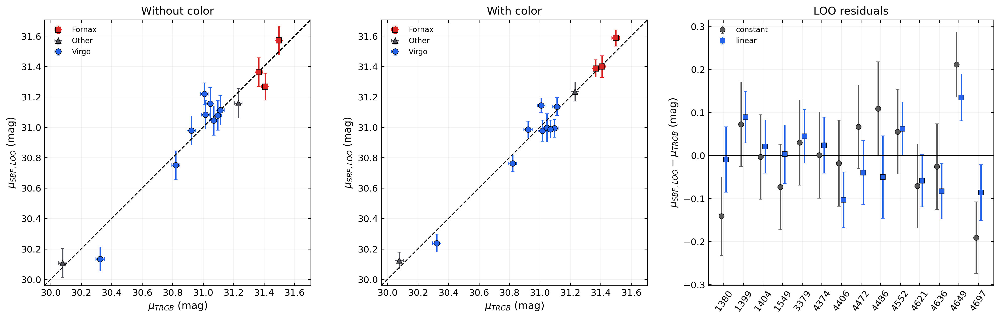

In [19]:
fig, axes = plt.subplots(1, 3, figsize=(16.2, 5.2))
limits = [
    min(loo_distances["mu_trgb"].min(), loo_distances["mu_sbf"].min()) - 0.12,
    max(loo_distances["mu_trgb"].max(), loo_distances["mu_sbf"].max()) + 0.12,
]
for ax, model, title in zip(axes[:2], ["constant", "linear"], ["Without color", "With color"]):
    group = loo_distances[loo_distances["model"].eq(model)]
    for environment, points in group.groupby("environment"):
        style = environment_style[environment]
        ax.errorbar(points["mu_trgb"], points["mu_sbf"],
                    xerr=points["sigma_mu_trgb"], yerr=points["sigma_mu_internal"],
                    fmt=style["marker"], color=style["color"], mec="black", mew=0.6,
                    ms=6.5, capsize=2, linestyle="none", label=environment)
    ax.plot(limits, limits, "k--", lw=1.2)
    ax.set(xlim=limits, ylim=limits, xlabel=r"$\mu_{TRGB}$ (mag)",
           ylabel=r"$\mu_{SBF,LOO}$ (mag)", title=title)
    ax.set_aspect("equal", adjustable="box")
x = np.arange(len(master))
for model, offset, color, marker in [("constant", -0.12, "0.35", "o"), ("linear", 0.12, "#2563eb", "s")]:
    group = loo_distances[loo_distances["model"].eq(model)].set_index("galaxy").loc[master["galaxy"]]
    axes[2].errorbar(x + offset, group["delta_mu_sbf_minus_trgb"],
                     yerr=group["sigma_delta_validation"], fmt=marker, color=color,
                     mec="black", mew=0.5, capsize=2, label=model)
axes[2].axhline(0, color="black", lw=1)
axes[2].set(xticks=x, xticklabels=master["galaxy"].str.replace("NGC ", ""),
            ylabel=r"$\mu_{SBF,LOO}-\mu_{TRGB}$ (mag)", title="LOO residuals")
axes[2].tick_params(axis="x", rotation=55)
for ax in axes:
    ax.legend(frameon=False)
fig.tight_layout()
save_show(fig, "go3055_f090w_distance_validation")

## 11. Бюджет ошибок как в анализе F150W

Длина горизонтального столбца — полная дисперсия, цветные участки — суммы
$\sigma_i^2$, а не самих $\sigma_i$. На верхнем рисунке показаны ошибки
точек $\overline M_{090}$. На нижнем постоянная и цветовая калибровки
показаны рядом; чёрный ромб — итоговая $\sigma$ в обычных mag.

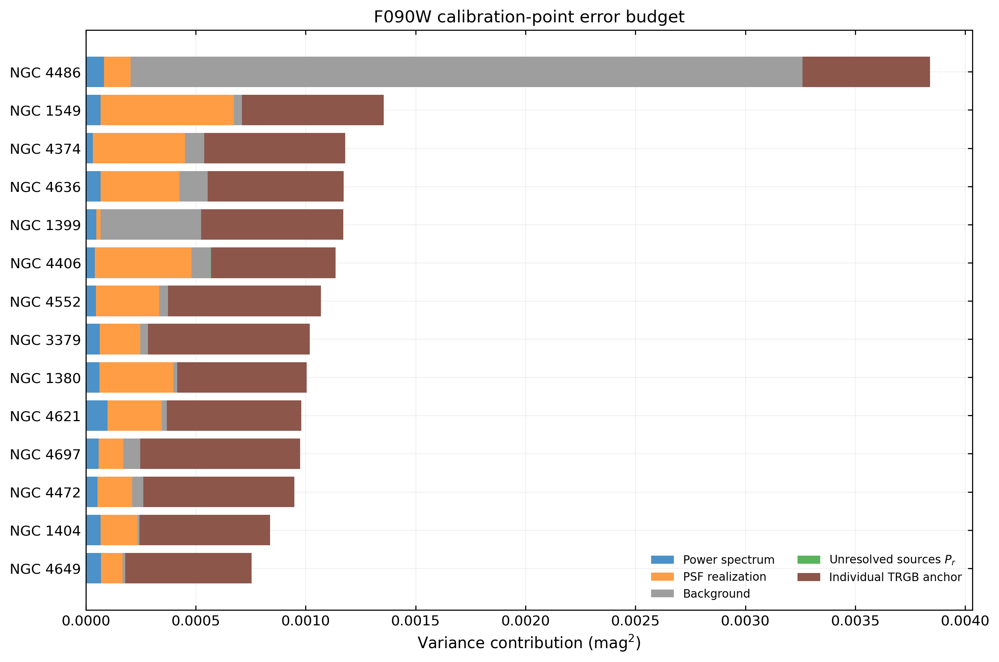

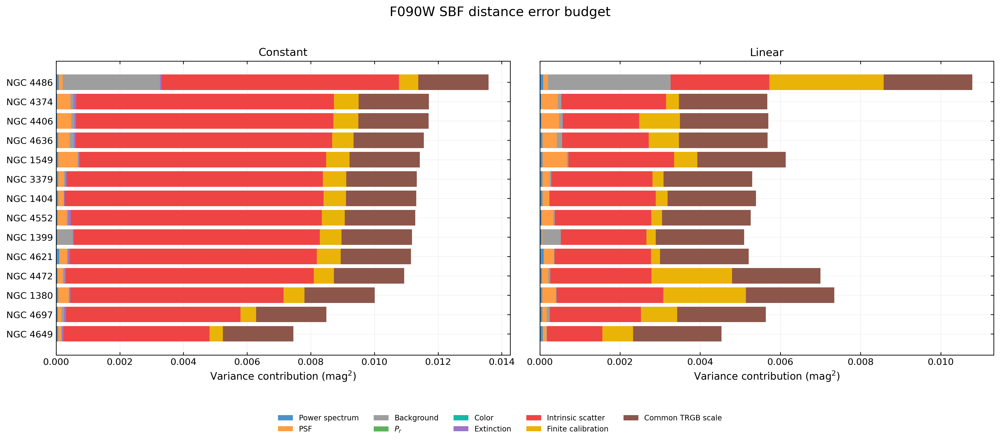

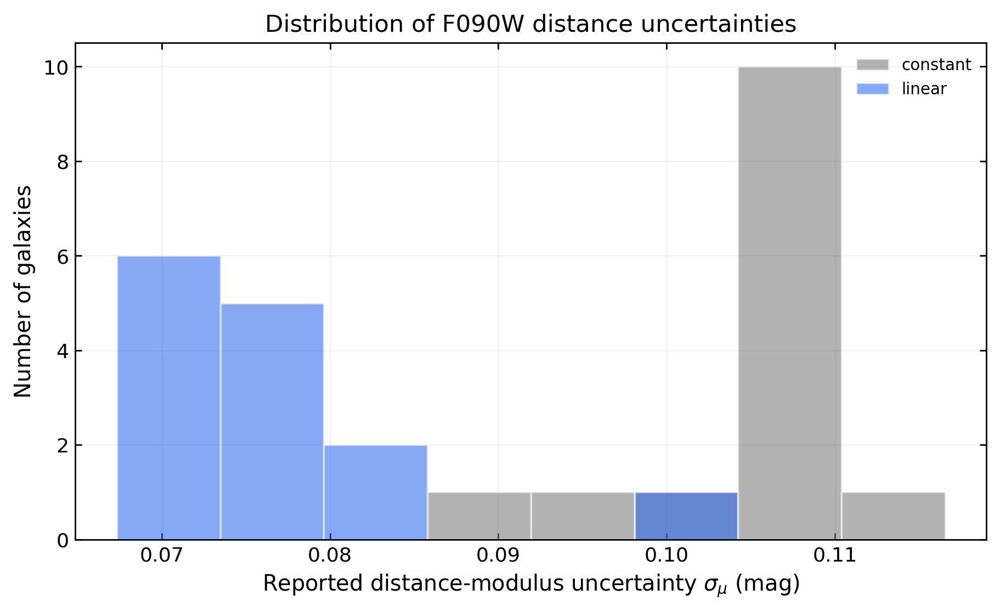

In [20]:
calibration_components = [
    ("sigma_measurement_mag", "Power spectrum", "#4c91c7"),
    ("sigma_psf_mag", "PSF realization", "#ff9d45"),
    ("sigma_sky_mag", "Background", "#9e9e9e"),
    ("sigma_Pr_mag", r"Unresolved sources $P_r$", "#59b35a"),
    ("sigma_mu_without_reddening_mag", "Individual TRGB anchor", "#8c564b"),
]
calibration_budget = master[["galaxy"] + [item[0] for item in calibration_components]].copy()
calibration_budget["total_variance"] = sum(calibration_budget[column]**2 for column, _, _ in calibration_components)
calibration_budget = calibration_budget.sort_values("total_variance")

fig, ax = plt.subplots(figsize=(10.5, 7.0))
left = np.zeros(len(calibration_budget))
for column, label, color in calibration_components:
    variance = calibration_budget[column].to_numpy()**2
    ax.barh(calibration_budget["galaxy"], variance, left=left, color=color, edgecolor="none", label=label)
    left += variance
ax.set(xlabel=r"Variance contribution (mag$^2$)",
       title=r"F090W calibration-point error budget")
ax.legend(frameon=False, loc="lower right", ncol=2)
fig.tight_layout()
save_show(fig, "go3055_f090w_calibration_error_budget")

distance_components = [
    ("sigma_measurement_mag", "Power spectrum", "#4c91c7"),
    ("sigma_psf_mag", "PSF", "#ff9d45"),
    ("sigma_sky_mag", "Background", "#9e9e9e"),
    ("sigma_Pr_mag", r"$P_r$", "#59b35a"),
    ("sigma_color_measurement_mag", "Color", "#14b8a6"),
    ("sigma_extinction_mag", "Extinction", "#9b75c9"),
    ("sigma_intrinsic_mag", "Intrinsic scatter", "#ef4444"),
    ("sigma_calibration_mag", "Finite calibration", "#eab308"),
    ("sigma_common_trgb_mag", "Common TRGB scale", "#8c564b"),
]

fig, axes = plt.subplots(1, 2, figsize=(16.0, 7.0), sharey=True)
distance_budget_rows = []
for ax, model in zip(axes, ["constant", "linear"]):
    budget = loo_distances[loo_distances["model"].eq(model)].copy()
    budget["sigma_common_trgb_mag"] = TRGB_COMMON_ZEROPOINT_MAG
    budget["total_variance"] = sum(budget[column]**2 for column, _, _ in distance_components)
    budget = budget.sort_values("total_variance")
    left = np.zeros(len(budget))
    for column, label, color in distance_components:
        variance = budget[column].to_numpy()**2
        ax.barh(budget["galaxy"], variance, left=left, color=color, edgecolor="none", label=label)
        left += variance
    ax.set(xlabel=r"Variance contribution (mag$^2$)", title=MODEL_LABELS[model])
    for row in budget.itertuples(index=False):
        distance_budget_rows.append({"model": model, **row._asdict()})
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, frameon=False, loc="lower center", ncol=5)
fig.suptitle("F090W SBF distance error budget", fontsize=15)
fig.tight_layout(rect=[0, 0.10, 1, 0.96])
save_show(fig, "go3055_f090w_distance_error_budget")
pd.DataFrame(distance_budget_rows).to_csv(TABLE_DIR / "go3055_f090w_distance_error_budget.csv", index=False)

fig, ax = plt.subplots(figsize=(7.4, 4.6))
bins = np.linspace(loo_distances["sigma_mu_total"].min(), loo_distances["sigma_mu_total"].max(), 9)
for model, color in [("constant", "0.45"), ("linear", "#2563eb")]:
    values = loo_distances.loc[loo_distances["model"].eq(model), "sigma_mu_total"]
    ax.hist(values, bins=bins, alpha=0.55, color=color, label=model, edgecolor="white")
ax.set(xlabel=r"Reported distance-modulus uncertainty $\sigma_\mu$ (mag)",
       ylabel="Number of galaxies", title="Distribution of F090W distance uncertainties")
ax.legend(frameon=False)
fig.tight_layout()
save_show(fig, "go3055_f090w_distance_uncertainty_histogram")

## 12. Прямое F090W–F150W SBF-сравнение

Левая панель использует один и тот же Paper-IV anchor по обеим осям, поэтому
видимая корреляция частично общая по построению. Правая панель показывает
независимый от расстояния SBF-цвет
$\overline m_{090}-\overline m_{150}$ относительно обычного цвета галактики.

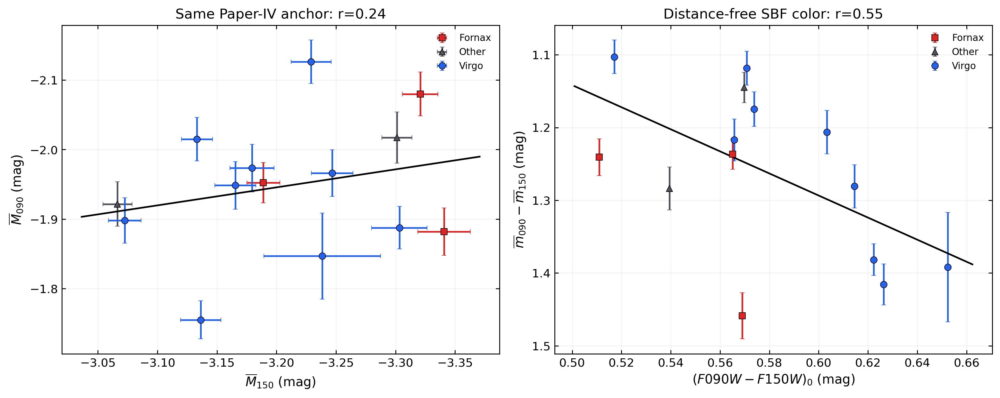

,absolute_sbf_slope,absolute_sbf_pearson_r,absolute_sbf_pearson_p,sbf_color_slope,sbf_color_pearson_r,sbf_color_pearson_p
0,0.2592,0.2418,0.4049,1.5181,0.5498,0.0417


In [21]:
sbf_cross = master[[
    "galaxy", "environment", "color_F090W_F150W", "Mbar_F090W", "sigma_Mbar_F090W",
    "Mbar_F150W", "mbar_F090W_0", "mbar_F150W", "sigma_mbar_internal",
]].copy()
sbf_cross["sbf_color_090_minus_150"] = sbf_cross["mbar_F090W_0"] - sbf_cross["mbar_F150W"]
sbf_cross["sigma_sbf_color"] = np.hypot(master["sigma_mbar_internal"], master["sigma_mbar_internal_F150"])
absolute_fit = linregress(sbf_cross["Mbar_F150W"], sbf_cross["Mbar_F090W"])
color_fit = linregress(sbf_cross["color_F090W_F150W"], sbf_cross["sbf_color_090_minus_150"])

fig, axes = plt.subplots(1, 2, figsize=(12.6, 5.1))
for environment, group in sbf_cross.groupby("environment"):
    style = environment_style[environment]
    axes[0].errorbar(group["Mbar_F150W"], group["Mbar_F090W"],
                     xerr=master.set_index("galaxy").loc[group["galaxy"], "sigma_mbar_internal_F150"],
                     yerr=group["sigma_Mbar_F090W"], fmt=style["marker"],
                     color=style["color"], mec="black", mew=0.5, capsize=2,
                     linestyle="none", label=environment)
    axes[1].errorbar(group["color_F090W_F150W"], group["sbf_color_090_minus_150"],
                     yerr=group["sigma_sbf_color"], fmt=style["marker"], color=style["color"],
                     mec="black", mew=0.5, capsize=2, linestyle="none", label=environment)
grid_left = np.linspace(sbf_cross["Mbar_F150W"].min() - 0.03, sbf_cross["Mbar_F150W"].max() + 0.03, 200)
axes[0].plot(grid_left, absolute_fit.intercept + absolute_fit.slope * grid_left, color="black")
grid_right = np.linspace(sbf_cross["color_F090W_F150W"].min() - 0.01,
                         sbf_cross["color_F090W_F150W"].max() + 0.01, 200)
axes[1].plot(grid_right, color_fit.intercept + color_fit.slope * grid_right, color="black")
axes[0].set(xlabel=r"$\overline{M}_{150}$ (mag)", ylabel=r"$\overline{M}_{090}$ (mag)",
            title=f"Same Paper-IV anchor: r={absolute_fit.rvalue:.2f}")
axes[1].set(xlabel=r"$(F090W-F150W)_0$ (mag)",
            ylabel=r"$\overline{m}_{090}-\overline{m}_{150}$ (mag)",
            title=f"Distance-free SBF color: r={color_fit.rvalue:.2f}")
axes[0].invert_xaxis(); axes[0].invert_yaxis()
axes[1].invert_yaxis()
for ax in axes:
    ax.legend(frameon=False)
fig.tight_layout()
save_show(fig, "go3055_f090w_vs_f150w_sbf")

sbf_cross_summary = pd.DataFrame([{
    "absolute_sbf_slope": absolute_fit.slope,
    "absolute_sbf_pearson_r": absolute_fit.rvalue,
    "absolute_sbf_pearson_p": absolute_fit.pvalue,
    "sbf_color_slope": color_fit.slope,
    "sbf_color_pearson_r": color_fit.rvalue,
    "sbf_color_pearson_p": color_fit.pvalue,
}])
sbf_cross.to_csv(TABLE_DIR / "go3055_f090w_vs_f150w_sbf.csv", index=False)
sbf_cross_summary.to_csv(TABLE_DIR / "go3055_f090w_vs_f150w_sbf_summary.csv", index=False)
display(sbf_cross_summary.round(4))

## 13. STPSF 129 против 257 пикселей

Для NGC 1380, NGC 3379 и NGC 1399 локально строится 257-пиксельная STPSF
с тем же OPD. Результат кэшируется. Сравниваются заключённая энергия и
форма спектра в рабочем диапазоне $0.04\le k\le0.25$.

Это изолированный тест размера PSF: он не повторяет изофоты и маскирование.
Приведённая $\Delta\overline m$ показывает спектральную чувствительность
к замене 257-пиксельной PSF опубликованной 129-пиксельной формой. Положительный знак
означает $\overline m_{129}-\overline m_{257}>0$. Это диагностика, а не готовая $\sigma_{\rm PSF}$.

**WARNING**: LOCAL JWST PRD VERSION PRDOPSSOC-072 DOESN'T MATCH THE CURRENT ONLINE VERSION PRDOPSSOC-073
Please consider updating pysiaf, e.g. pip install --upgrade pysiaf or conda update pysiaf


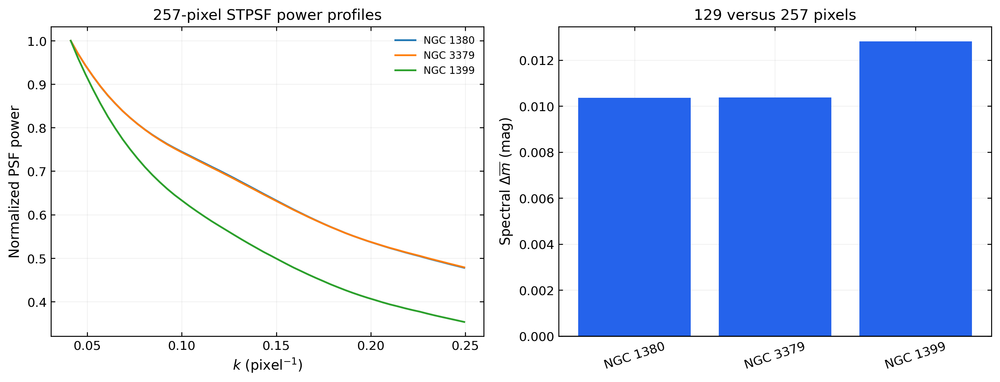

,galaxy,fraction_inside_central_129,missing_flux_percent,spectral_power_ratio,delta_mbar_129_minus_257_mag,constant_offset
0,NGC 1380,0.9953,0.4647,0.9905,0.0104,-1.0000e-05
1,NGC 3379,0.9953,0.4657,0.9905,0.0104,-1.0000e-05
2,NGC 1399,0.9942,0.5746,0.9883,0.0128,-1.0000e-05


In [22]:
import stpsf

stpsf_data = Path.home() / "data" / "stpsf-data"
if not stpsf_data.is_dir():
    raise FileNotFoundError(f"Локальные данные STPSF не найдены: {stpsf_data}")
os.environ["STPSF_PATH"] = str(stpsf_data)
psf_cache = ANALYSIS_DIR / "psf_257_cache"
psf_cache.mkdir(exist_ok=True)

fft_size = 512
k_edges = np.linspace(0, np.sqrt(0.5), 181)
k_centers = 0.5 * (k_edges[:-1] + k_edges[1:])
frequency = np.fft.fftfreq(fft_size)
k_radius = np.hypot(frequency[:, None], frequency[None, :])
bin_index = np.digitize(k_radius.ravel(), k_edges) - 1
valid_bins = (bin_index >= 0) & (bin_index < len(k_centers))

def psf_power_profile(image):
    image = np.asarray(image, float)
    image = image / image.sum()
    padded = np.zeros((fft_size, fft_size), float)
    y0 = fft_size // 2 - image.shape[0] // 2
    x0 = fft_size // 2 - image.shape[1] // 2
    padded[y0:y0 + image.shape[0], x0:x0 + image.shape[1]] = image
    power = np.abs(np.fft.fft2(padded))**2
    sums = np.bincount(bin_index[valid_bins], power.ravel()[valid_bins], minlength=len(k_centers))
    counts = np.bincount(bin_index[valid_bins], minlength=len(k_centers))
    return sums / np.maximum(counts, 1)

psf_rows = []
fig, axes = plt.subplots(1, 2, figsize=(11.8, 4.6))
for galaxy in ["NGC 1380", "NGC 3379", "NGC 1399"]:
    row = master.set_index("galaxy").loc[galaxy]
    library_path = next(Path(row.source_output_dir).glob("*_psf_library.csv"))
    psf_metadata = pd.read_csv(library_path).iloc[0]
    cache_path = psf_cache / f"{galaxy.replace(' ', '_')}_F090W_psf_257.fits"
    if cache_path.is_file():
        psf_257_raw = np.asarray(fits.getdata(cache_path), float)
    else:
        header = fits.getheader(row.signal_path, 0)
        simulator = stpsf.instrument(header["INSTRUME"])
        simulator.filter = header["FILTER"]
        simulator.set_position_from_aperture_name(header["APERNAME"])
        opd_absolute = DATA_DIR / "wss_opd" / Path(psf_metadata["opd_path"]).name
        opd_argument = os.path.relpath(opd_absolute, Path.cwd())
        simulator.load_wss_opd(opd_argument, verbose=False, plot=False)
        simulator.options["output_mode"] = "both"
        product = simulator.calc_psf(nlambda=7, fov_pixels=257, fft_oversample=4,
                                     detector_oversample=1, add_distortion=True)
        extension = "DET_DIST" if "DET_DIST" in product else "DET_SAMP"
        psf_257_raw = np.asarray(product[extension].data, float)
        fits.writeto(cache_path, psf_257_raw.astype("float32"), overwrite=True)

    with fits.open(row.psf_129_fits, memmap=False) as hdul:
        psf_129 = np.asarray(hdul[1].data, float)
    center = psf_257_raw.shape[0] // 2
    central_129 = psf_257_raw[center - 64:center + 65, center - 64:center + 65]
    enclosed_fraction = central_129.sum() / psf_257_raw.sum()

    profile_257 = psf_power_profile(psf_257_raw)
    profile_129 = psf_power_profile(psf_129)
    use = (k_centers >= 0.04) & (k_centers <= 0.25)
    coefficient, offset = np.linalg.lstsq(
        np.column_stack([profile_129[use], np.ones(use.sum())]),
        profile_257[use], rcond=None,
    )[0]
    delta_mbar = -2.5 * np.log10(coefficient)
    psf_rows.append({
        "galaxy": galaxy, "fraction_inside_central_129": enclosed_fraction,
        "missing_flux_percent": 100 * (1 - enclosed_fraction),
        "spectral_power_ratio": coefficient, "delta_mbar_129_minus_257_mag": delta_mbar,
        "constant_offset": offset,
    })
    axes[0].plot(k_centers[use], profile_257[use] / profile_257[use][0], label=galaxy)

psf_size_test = pd.DataFrame(psf_rows)
axes[0].set(xlabel=r"$k$ (pixel$^{-1}$)", ylabel="Normalized PSF power",
            title="257-pixel STPSF power profiles")
axes[0].legend(frameon=False)
axes[1].bar(psf_size_test["galaxy"], psf_size_test["delta_mbar_129_minus_257_mag"], color="#2563eb")
axes[1].axhline(0, color="black", lw=1)
axes[1].set(ylabel=r"Spectral $\Delta\overline{m}$ (mag)", title="129 versus 257 pixels")
axes[1].tick_params(axis="x", rotation=18)
fig.tight_layout()
save_show(fig, "go3055_f090w_psf_129_vs_257")
psf_size_test.to_csv(TABLE_DIR / "go3055_f090w_psf_129_vs_257.csv", index=False)
display(psf_size_test.round(5))

## 14. Итог notebook

Эта ячейка печатает только численные выводы, полученные выше. Она не
выбирает модель «на глаз»: сначала AICc, затем LOO, затем устойчивость в
заранее заданных подвыборках и к отдельным объектам.

In [23]:
best_aicc = model_comparison.iloc[0]
precision = precision_comparison.set_index("model")
improvement = 100 * (1 - precision.loc["linear", "loo_rms_mag"] / precision.loc["constant", "loo_rms_mag"])
all_sample = sample_comparison.set_index("sample").loc["All 14"]
print(f"Лучший AICc: {best_aicc.description} (AICc={best_aicc.aicc:.2f}).")
print(f"Линейный наклон на всех 14: {all_sample.linear_slope:+.3f} mag/mag.")
print(f"Pearson p={all_sample.pearson_p:.4g}; Spearman p={all_sample.spearman_p:.4g}.")
print(f"LOO RMS без цвета: {precision.loc['constant', 'loo_rms_mag']:.4f} mag.")
print(f"LOO RMS с цветом: {precision.loc['linear', 'loo_rms_mag']:.4f} mag.")
print(f"Относительное уменьшение LOO RMS: {improvement:.1f}%.")
print(f"Максимальная |PSF 129-257|: {psf_size_test.delta_mbar_129_minus_257_mag.abs().max():.4f} mag.")
print(f"Все таблицы: {TABLE_DIR}")

Лучший AICc: Logarithmic (AICc=-31.31).
Линейный наклон на всех 14: +1.889 mag/mag.
Pearson p=0.0011; Spearman p=0.005212.
LOO RMS без цвета: 0.0992 mag.
LOO RMS с цветом: 0.0684 mag.
Относительное уменьшение LOO RMS: 31.0%.
Максимальная |PSF 129-257|: 0.0128 mag.
Все таблицы: /Users/zuha/Desktop/FKI/4 курс 2025-2026/course_work-SBF/runs/sbf_f090w_go3055/analysis/tables
